In [1]:
source("/fs/home/shixiaoying/Project/Notebook/src/selina_data_curate.R")
suppressMessages(library(purrr))
suppressMessages(library(Seurat))
suppressMessages(library(sva))
suppressMessages(library(ggplot2))
suppressMessages(library(dplyr))
suppressMessages(library(harmony))
suppressMessages(library(MAESTRO))
suppressMessages(library(stringr))
suppressMessages(library(patchwork))

## Get rds files (Corresponding tissue & Adult & Annotated)

In [2]:
info = read.table('/fs/home/shixiaoying/HUSCH2/src/info0221.txt', sep='\t', stringsAsFactor=F, header=T)
info_sub = info[(grepl('Eye',info$Tissue.Major, ignore.case=T))&(grepl('Adult',info$Stage, ignore.case=T))&(!grepl('SELINA',info$Annotation, ignore.case=T)),]
rdspath_sub = sapply(info_sub$Path, function(x) list.files(x, pattern = '*rds', recursive = T, full.names = T), USE.NAMES=F)

In [3]:
rdspath_sub

[1] "/fs/home/shixiaoying/HUSCH2/GSE155683/processed/GSE155683_Eye-Adult_20460.rds"                      
[2] "/fs/home/shixiaoying/HUSCH2/GSE157474/processed/MAESTRO/GSE157474_Eye-Adult_47498.rds"              
[3] "/fs/home/shixiaoying/HUSCH2/GSE169047/processed/MAESTRO/GSE169047_Eye-Adult_29073_Donor_CCA_res.rds"

In [4]:
# read in files
data_list = sapply(rdspath_sub, function(x){
    out <- tryCatch({
        rds=readRDS(x)
        return(list(rds))},
        error=function(cond){
            return(NULL)
            })
            return(out)
            })

In [5]:
for(i in 1:length(rdspath_sub)){
    print(i)
    if(length(data_list[[i]])==1){
        data_list[[i]]=data_list[[i]]
    }else{
        data_list[[i]]=data_list[[i]]$RNA
    }   
}

[1] 1
[1] 2
[1] 3


In [6]:
# Check files' meta information (Remember to remove useless column)
for(i in 1:length(rdspath_sub)){
    print(i)
    print(rdspath_sub[i])
    rds=data_list[[i]]
    print(colnames(rds@meta.data))
}

[1] 1
[1] "/fs/home/shixiaoying/HUSCH2/GSE155683/processed/GSE155683_Eye-Adult_20460.rds"
 [1] "orig.ident"           "nCount_RNA"           "nFeature_RNA"        
 [4] "RNA_snn_res.1"        "seurat_clusters"      "assign.ident"        
 [7] "assign.score"         "Donor"                "Platform"            
[10] "Sample"               "batch"                "integrated_snn_res.1"
[13] "manual.assign"       
[1] 2
[1] "/fs/home/shixiaoying/HUSCH2/GSE157474/processed/MAESTRO/GSE157474_Eye-Adult_47498.rds"
 [1] "orig.ident"      "nCount_RNA"      "nFeature_RNA"    "RNA_snn_res.1"  
 [5] "seurat_clusters" "Donor"           "nGene"           "nUMI"           
 [9] "Percent.mito"    "Celltype"       
[1] 3
[1] "/fs/home/shixiaoying/HUSCH2/GSE169047/processed/MAESTRO/GSE169047_Eye-Adult_29073_Donor_CCA_res.rds"
 [1] "orig.ident"           "nCount_RNA"           "nFeature_RNA"        
 [4] "RNA_snn_res.1"        "seurat_clusters"      "assign.ident"        
 [7] "assign.score"         "GSM"

## Remember to check Platform infromation

In [181]:
data_list[[2]]$Platform = '10X Genomics'

In [7]:
# add a column 'curated.assign', which is 'manual.assign' or 'Celltype'(in our annotation process, we use 'Celltype' when paper has original annotation and use 'manual.assign' when we annotated with marker by ourselves)
data_list[[1]]@meta.data$curated.assign = data_list[[1]]@meta.data$manual.assign
data_list[[2]]@meta.data$curated.assign = data_list[[2]]@meta.data$Celltype
data_list[[3]]@meta.data$curated.assign = data_list[[3]]@meta.data$manual.assign

## Filter out <10 cell type¶¶

In [8]:
for(i in 1:length(data_list)){
    if(length(data_list[[i]])==1){
        tb=table(data_list[[i]]$curated.assign)
        for(ct in names(tb)){
            if(tb[ct]<=10){
                data_list[[i]]$curated.assign[data_list[[i]]$curated.assign == ct] = paste0(ct,'_Unknown')
            }
        }
    }else{
        tb=table(data_list[[i]]$RNA$curated.assign)
        for(ct in names(tb)){
            if(tb[ct]<=10){
                data_list[[i]]$RNA$curated.assign[data_list[[i]]$RNA$curated.assign == ct] = paste0(ct,'_Unknown')
            }
        }
    }   
}

In [9]:
# for checking cell type (human reading)
allLevel4CT <- c()
for (i in 1:length(data_list)){
    print(i)
    print(unique(sort(data_list[[i]]$curated.assign)))
    allLevel4CT <- c(allLevel4CT, unique(data_list[[i]]$curated.assign))
}
allLevel4CT <- data.frame(sort(unique(allLevel4CT)), stringsAsFactors = F)
colnames(allLevel4CT) <- 'manual'
allLevel4CT[!grepl('Unknown',allLevel4CT$manual),,drop=FALSE]

[1] 1
 [1] "Blood vesels"                           
 [2] "Conjunctival Basal Epithelium"          
 [3] "Corneal Basal  Epithelium"              
 [4] "Corneal Endothelium"                    
 [5] "Corneal stromal Cell"                   
 [6] "Fibroblastic  Corneal Endothelial Cells"
 [7] "Immune cells"                           
 [8] "Limbal Fibroblasts"                     
 [9] "Limbal Neural Crest Progenitors"        
[10] "Limbal Progenitor cells"                
[11] "Limbal Stroma Keratocytes"              
[12] "Limbal Superficial Epithelium"          
[13] "Limbal Suprabasal Cells"                
[14] "Lymphatic vessels"                      
[15] "Melanocytes"                            
[1] 2
[1] "Immune cell"                "limbal epithelial cell"    
[3] "lymphatic endothelial cell" "melanocyte"                
[5] "Pericyte"                   "Schwann cell"              
[7] "Stromal cell"               "vascular endothelial cell" 
[1] 3
 [1] "Amacrine"    "Astrocyte

,manual
,<chr>
1,Amacrine
2,Astrocyte
3,Blood vesels
4,Cone
5,Cone-off-BC
6,Conjunctival Basal Epithelium
7,Corneal Basal Epithelium
8,Corneal Endothelium
9,Corneal stromal Cell


## Unify cell-type names
###  Run next 2 cells in a loop to make sure there are no duplicated names of same cell-type

In [10]:
# for checking cell type (human reading)
allLevel4CT <- c()
for (i in 1:length(data_list)){
    print(i)
    print(unique(sort(data_list[[i]]$curated.assign)))
    allLevel4CT <- c(allLevel4CT, unique(data_list[[i]]$curated.assign))
}
allLevel4CT <- data.frame(sort(unique(allLevel4CT)), stringsAsFactors = F)
colnames(allLevel4CT) <- 'manual'
# allLevel4CT[!grepl('Unknown',allLevel4CT$manual),,drop=FALSE]

[1] 1
 [1] "Blood vesels"                           
 [2] "Conjunctival Basal Epithelium"          
 [3] "Corneal Basal  Epithelium"              
 [4] "Corneal Endothelium"                    
 [5] "Corneal stromal Cell"                   
 [6] "Fibroblastic  Corneal Endothelial Cells"
 [7] "Immune cells"                           
 [8] "Limbal Fibroblasts"                     
 [9] "Limbal Neural Crest Progenitors"        
[10] "Limbal Progenitor cells"                
[11] "Limbal Stroma Keratocytes"              
[12] "Limbal Superficial Epithelium"          
[13] "Limbal Suprabasal Cells"                
[14] "Lymphatic vessels"                      
[15] "Melanocytes"                            
[1] 2
[1] "Immune cell"                "limbal epithelial cell"    
[3] "lymphatic endothelial cell" "melanocyte"                
[5] "Pericyte"                   "Schwann cell"              
[7] "Stromal cell"               "vascular endothelial cell" 
[1] 3
 [1] "Amacrine"    "Astrocyte

In [11]:
# for unifying cell types, some tips are generic
for (i in 1:length(data_list)){
    data_list[[i]]$curated.assign <- gsub('s$','',data_list[[i]]$curated.assign)
    data_list[[i]]$curated.assign = gsub(" cell$", "", data_list[[i]]$curated.assign, ignore.case = T)
    data_list[[i]]$curated.assign = gsub("  ", " ", data_list[[i]]$curated.assign, ignore.case = T)
    data_list[[i]]$curated.assign = sapply(data_list[[i]]$curated.assign, simpleCap)
}

## check each dataset

In [12]:
rdspath_sub

[1] "/fs/home/shixiaoying/HUSCH2/GSE155683/processed/GSE155683_Eye-Adult_20460.rds"                      
[2] "/fs/home/shixiaoying/HUSCH2/GSE157474/processed/MAESTRO/GSE157474_Eye-Adult_47498.rds"              
[3] "/fs/home/shixiaoying/HUSCH2/GSE169047/processed/MAESTRO/GSE169047_Eye-Adult_29073_Donor_CCA_res.rds"

## GSE155683

In [13]:
# GSE155683
# collect markers
marker_list <- list()
marker_list['Blood vesels'] <- list(c('CLDN5','ACKR1','SPARCL1','POSTN','A2M'))
marker_list['Conjunctival Basal Epithelium'] <- list(c('KRT13','KRT19','SLP1','AQP3'))
marker_list['Conjunctival Superficial Epithelium'] <- list(c('AQP5','LCN2','F8','CEACAM7','CXCL17'))
marker_list['Corneal  Suprabasal Cells'] <- list(c('MSMB','FGFBP','FGFBP1','CTSV'))
marker_list['Corneal Basal  Epithelium'] <- list(c('GJB6','DAPL1','TKT','TGFBI','MGARP'))
marker_list['Corneal Endothelium'] <- list(c('CDH19','PLP1','SCN7A','GPM6B','GPX3'))
marker_list['Corneal stromal keratocytes'] <- list(c('DCN','PTGDS','APOD','LUM','IER3'))
marker_list['Corneal Stromal Stem Cells'] <- list(c('SAA1','DCN','KERA','ANGPTL7','PTGDS','LUM','COL12A1'))
marker_list['Corneal Superficial Epithelium'] <- list(c('AREG','APOBEC3A','IL1A','EMP1','LGALSL'))
marker_list['Fibroblastic Corneal Endothelial Cells'] <- list(c('TAGLN','MYL9','ACTA2','RGS5','TPM2'))
marker_list['Immune cells'] <- list(c('CCL3','CXCL8','IL1B','CCL5','CXCR4','IGHG4'))
marker_list['Limbal Fibroblasts'] <- list(c('FBLN1','MGP','LEPR','IGFBP5','C1S'))
marker_list['Limbal Neural Crest Progenitors'] <- list(c('KRT14','CXCL14','COL17A1','NTRK2','BCAM'))
marker_list['Limbal Progenitor cells'] <- list(c('S100A2','KRT14','KRT14','NCOA7','SLC6A6','DST'))
marker_list['Limbal Stroma Keratocytes'] <- list(c('COL1A1','COL3A3','COL1A2','CFD','SPARC'))
marker_list['Limbal Superficial Epithelium'] <- list(c('KRT24','KRT4','LYPD2','HRASLS2','HOPX','RARRES3','ASPG','LGALS3'))
marker_list['Limbal Suprabasal Cells'] <- list(c('KRT15','KRT14','CXCL14','CLU','LINC01474','COL17A1','CRTAC1','NDUFA4L2'))
marker_list['Lymphatic vessels'] <- list(c('CCL21','MMRN1','CLDN5','TFP1','GNG11','LYVE1','TFF3'))
marker_list['Melanocytes'] <- list(c('DCT','TYRP1','PMEL','APOE','MLANA','QPCT','MITF'))
marker_list['Red Blood Cells'] <- list(c('HBB','HBA2','HBG2','HBA1','RPS3'))

In [14]:
tmp = names(marker_list)
tmp <- gsub('s$','',tmp)
tmp <- gsub(" cell$", "",tmp, ignore.case = T)
tmp <- gsub("  ", " ", tmp, ignore.case = T)
tmp <- sapply(tmp, simpleCap)
names(marker_list) <- tmp
allmarker <- marker_list
allmarker <- unlist(allmarker, use.names=F)
allmarker <- unique(allmarker)

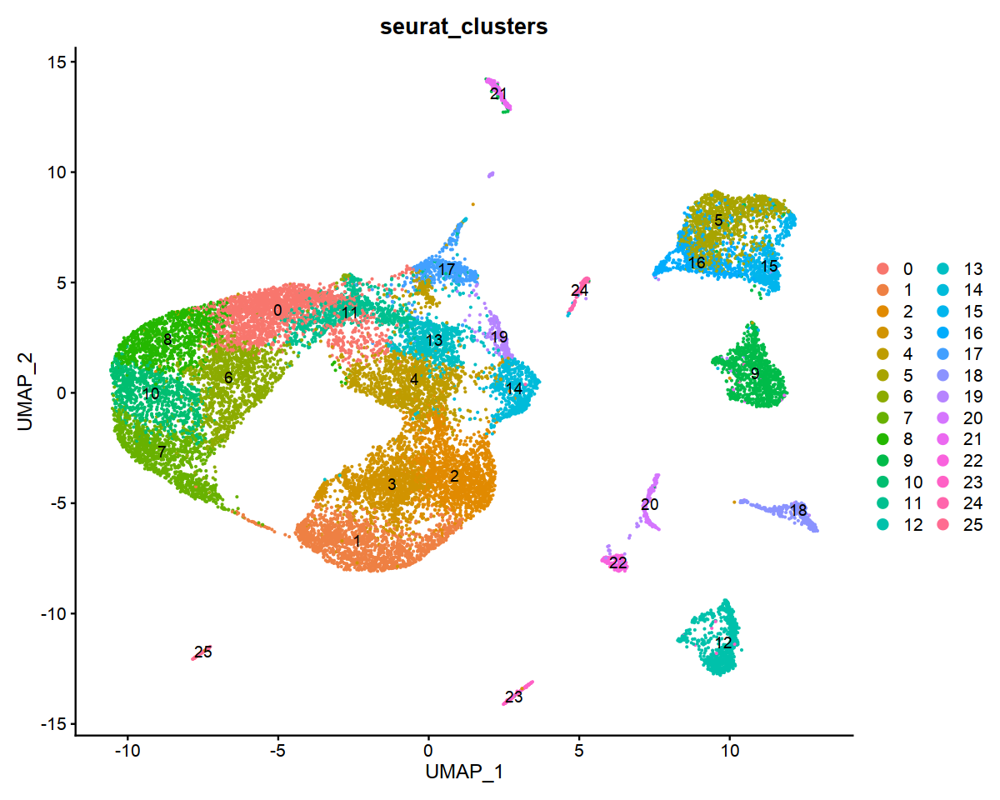

In [27]:
options(repr.plot.height=8,repr.plot.width=10)
DimPlot(data_list[[1]], group.by='seurat_clusters', label = TRUE, pt.size = 0.1)

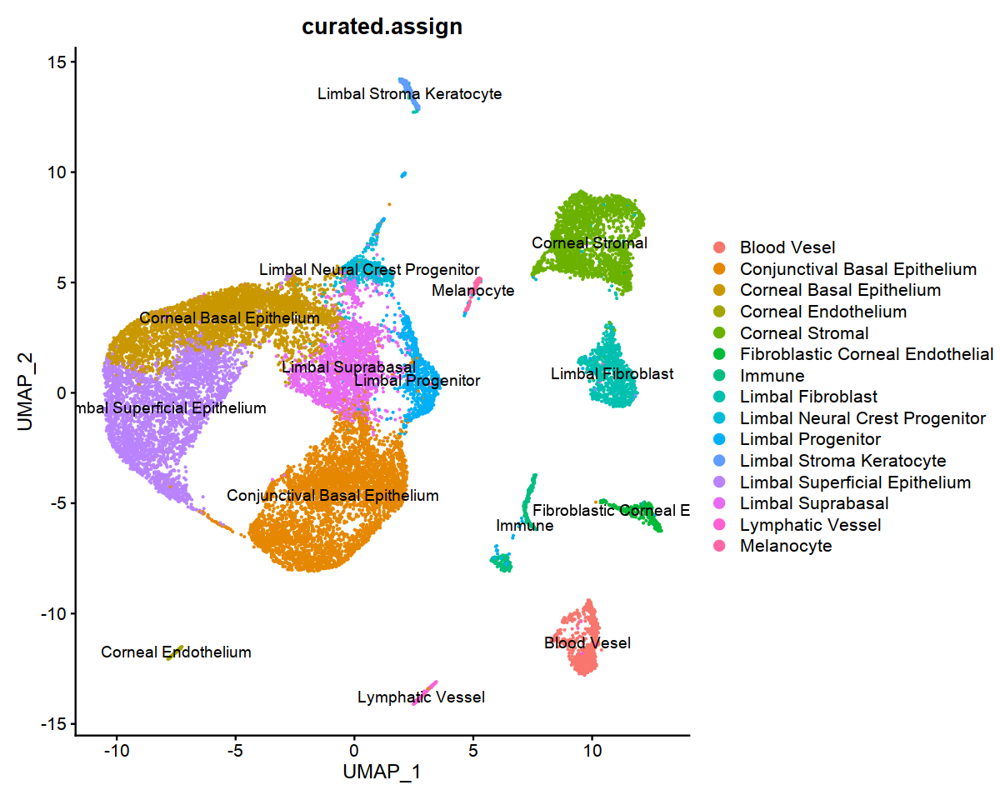

In [28]:
DimPlot(data_list[[1]], group.by='curated.assign', label = TRUE, pt.size = 0.1)

Warning message in FetchData(object = object, vars = c(dims, "ident", features), :
"The following requested variables were not found: SLP1"


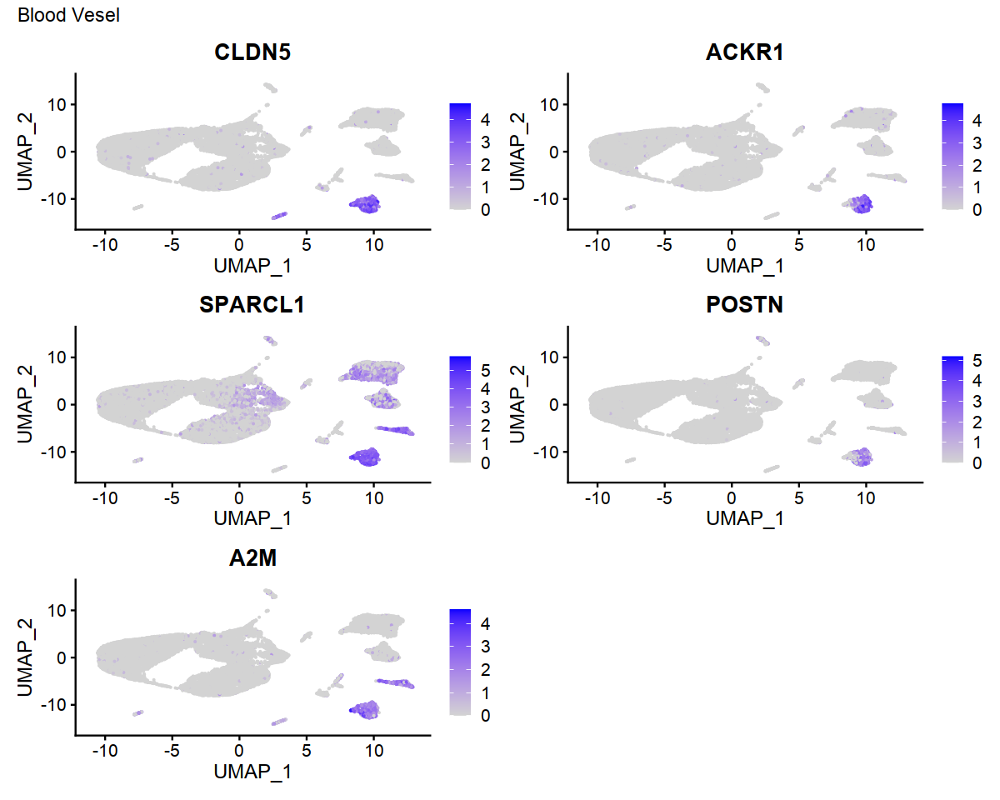

Warning message in FetchData(object = object, vars = c(dims, "ident", features), :
"The following requested variables were not found: FGFBP"


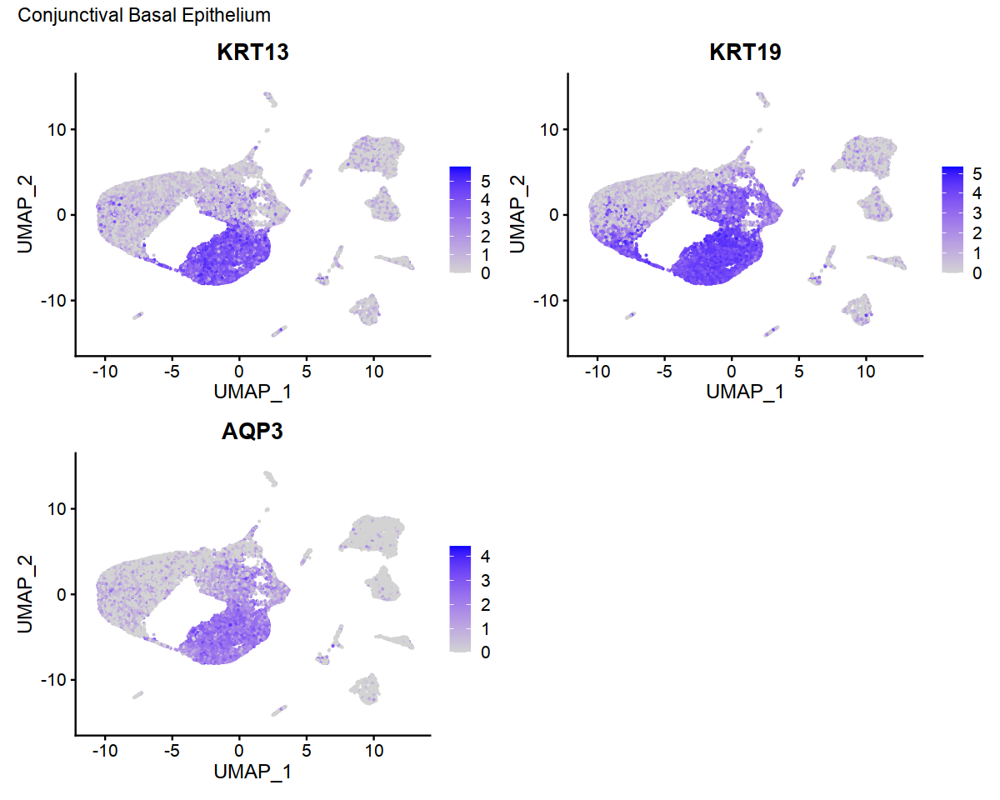

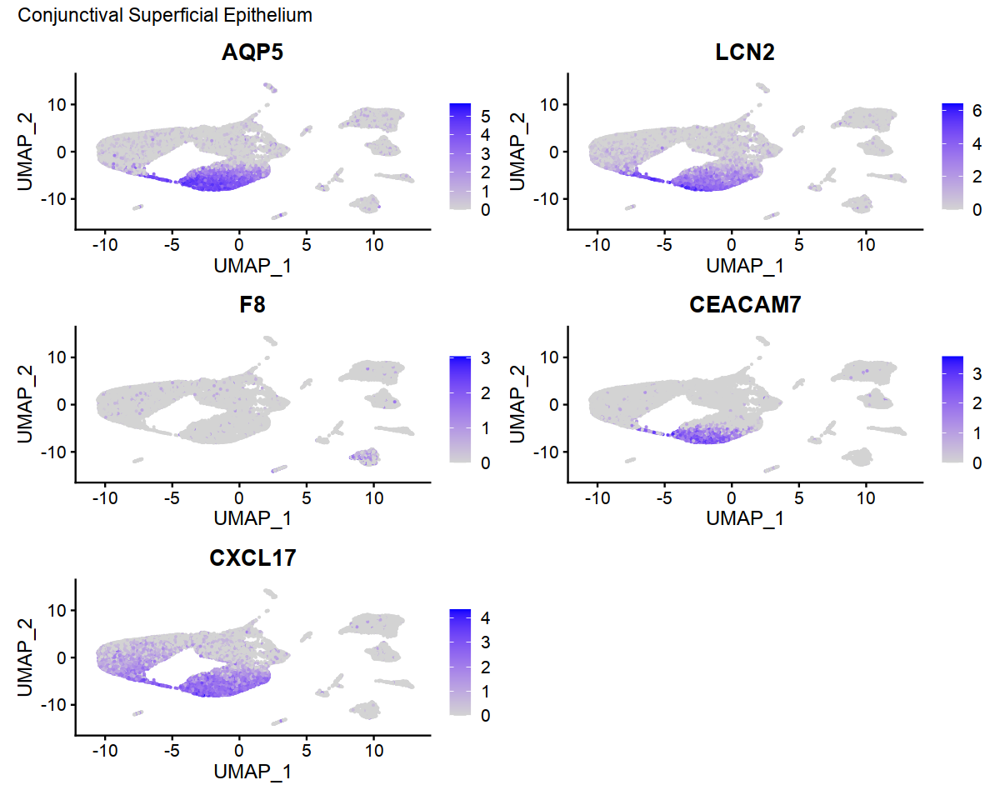

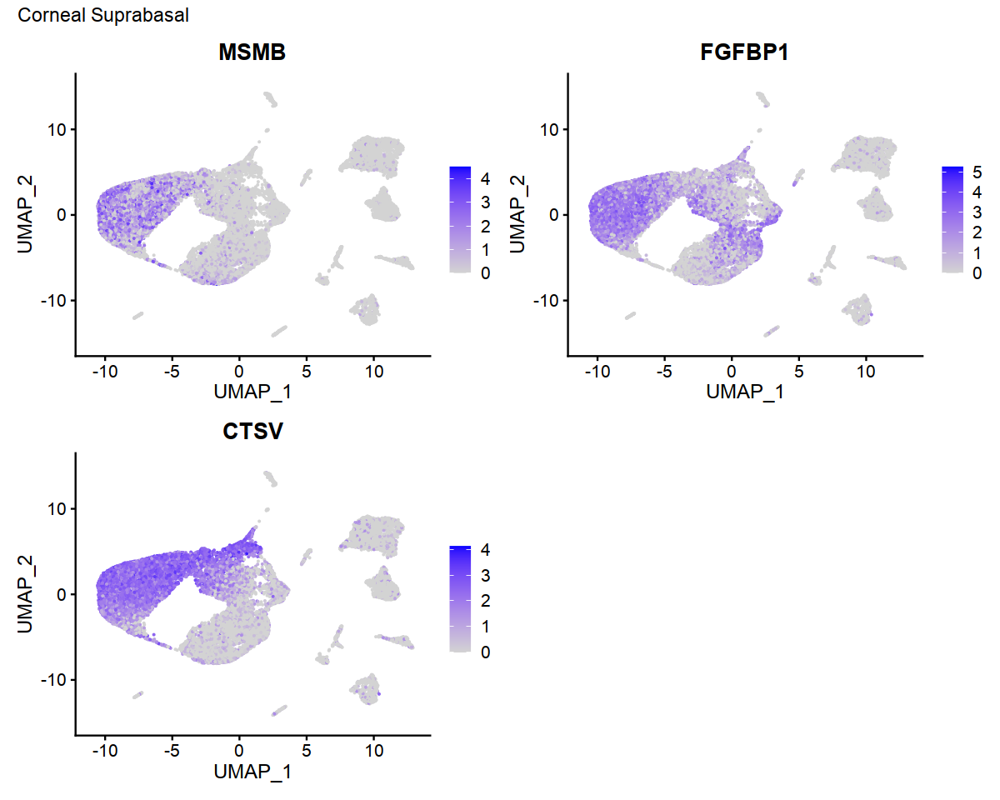

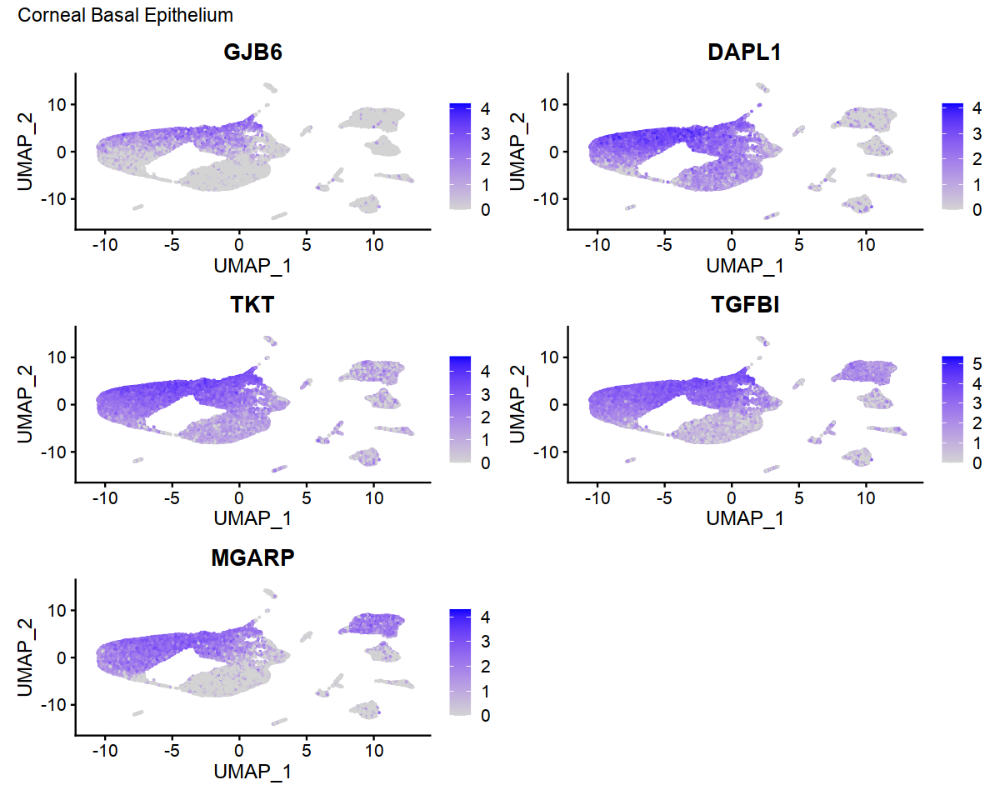

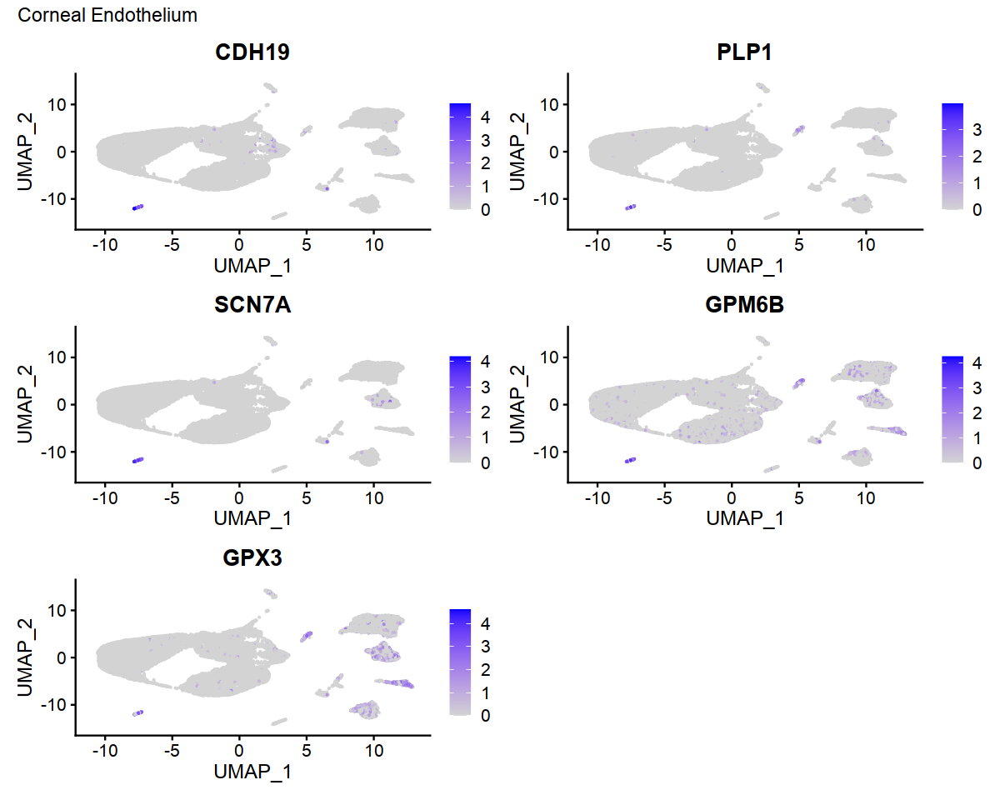

...

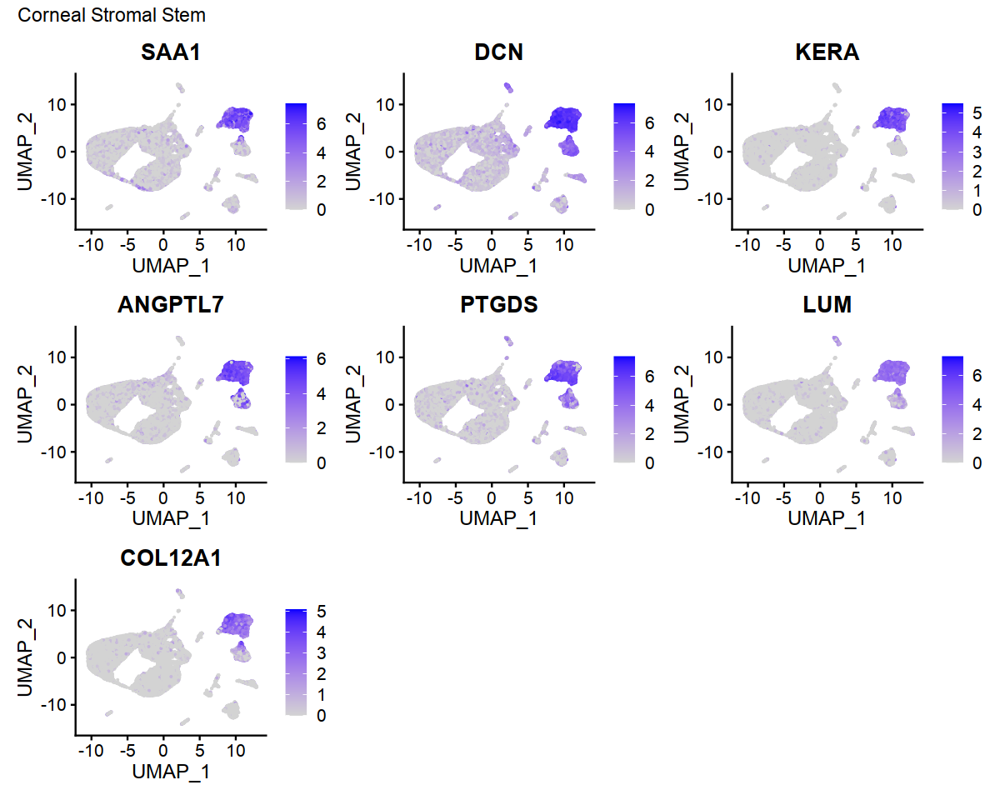

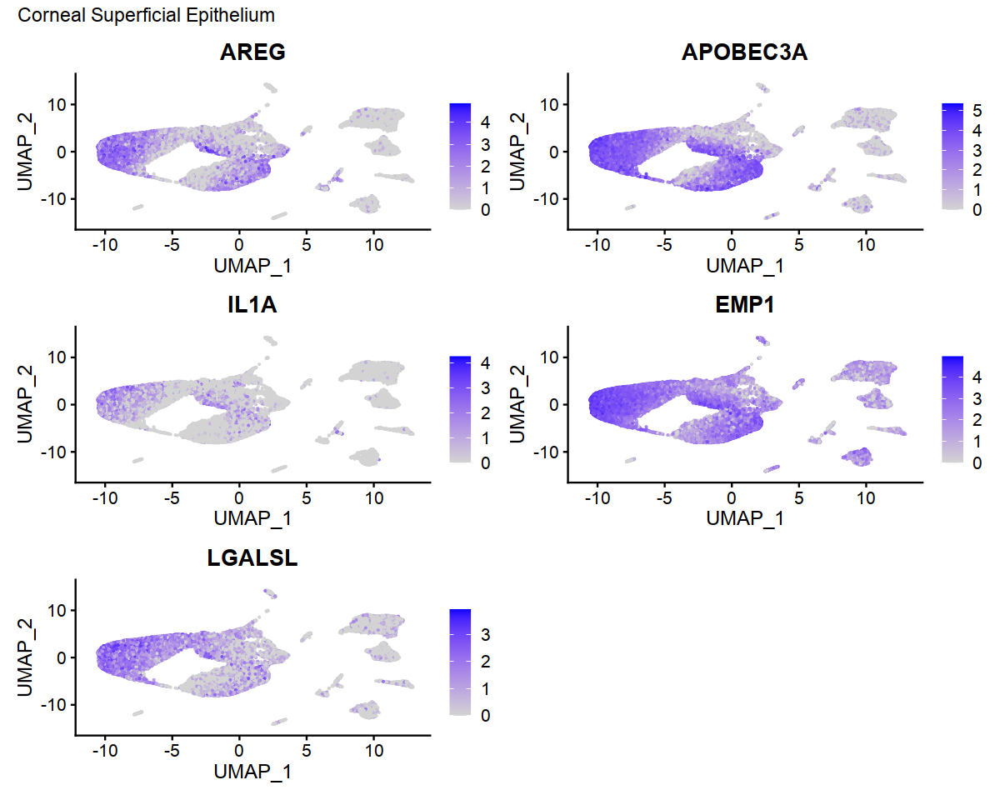

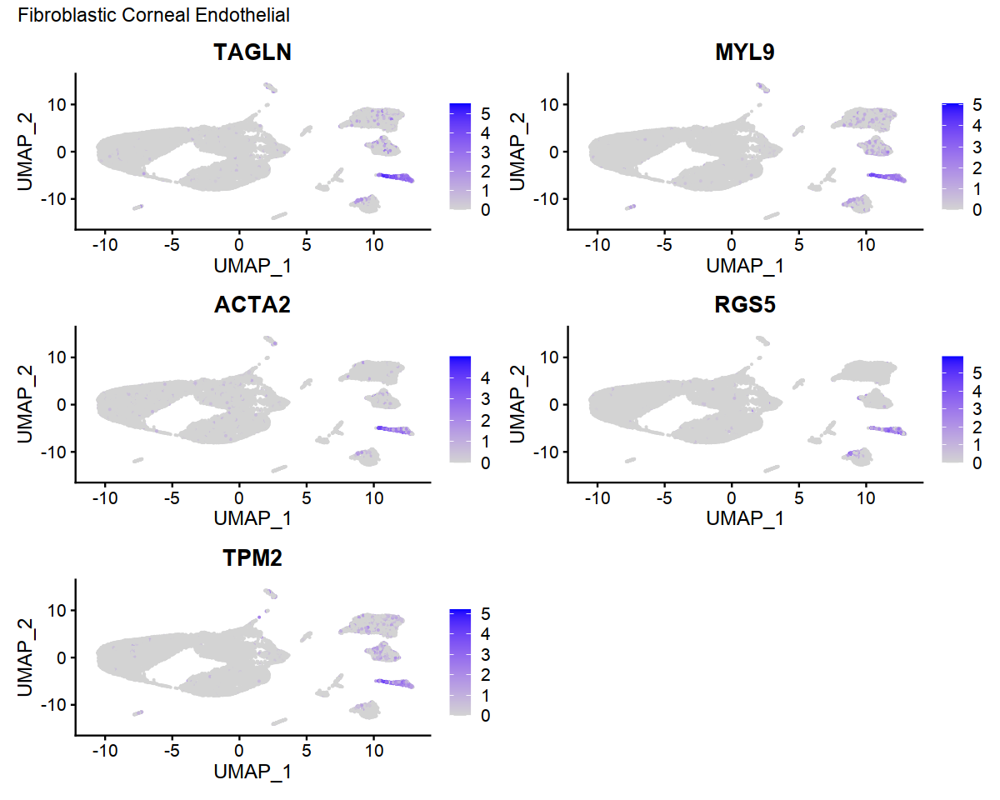

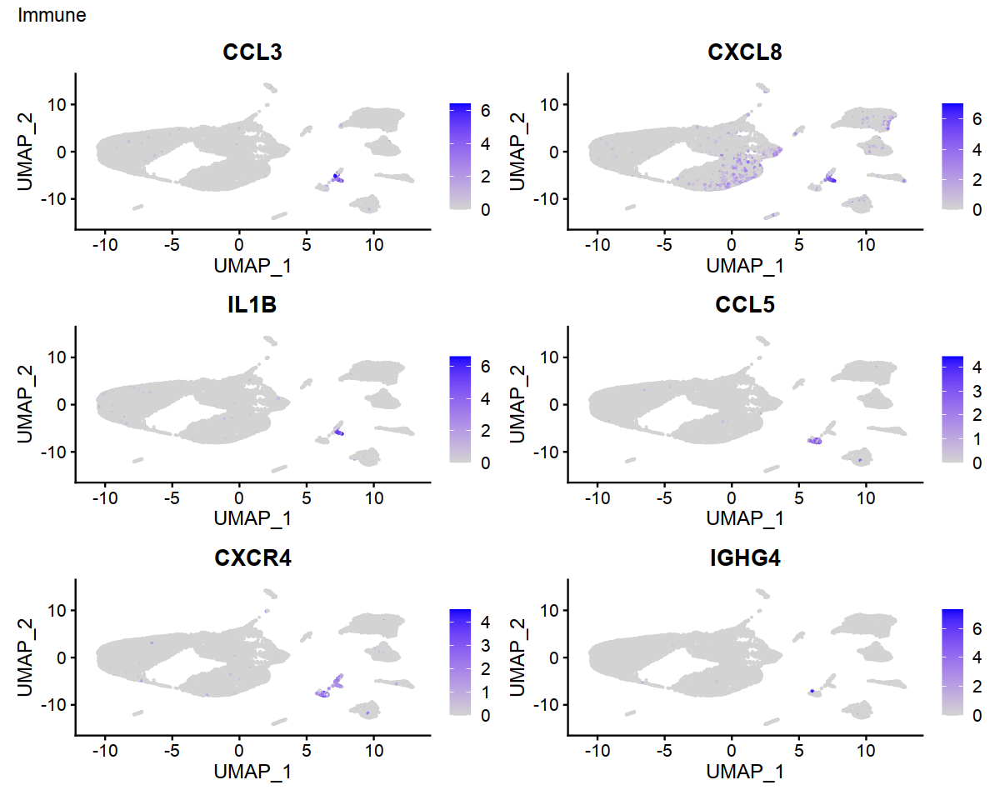

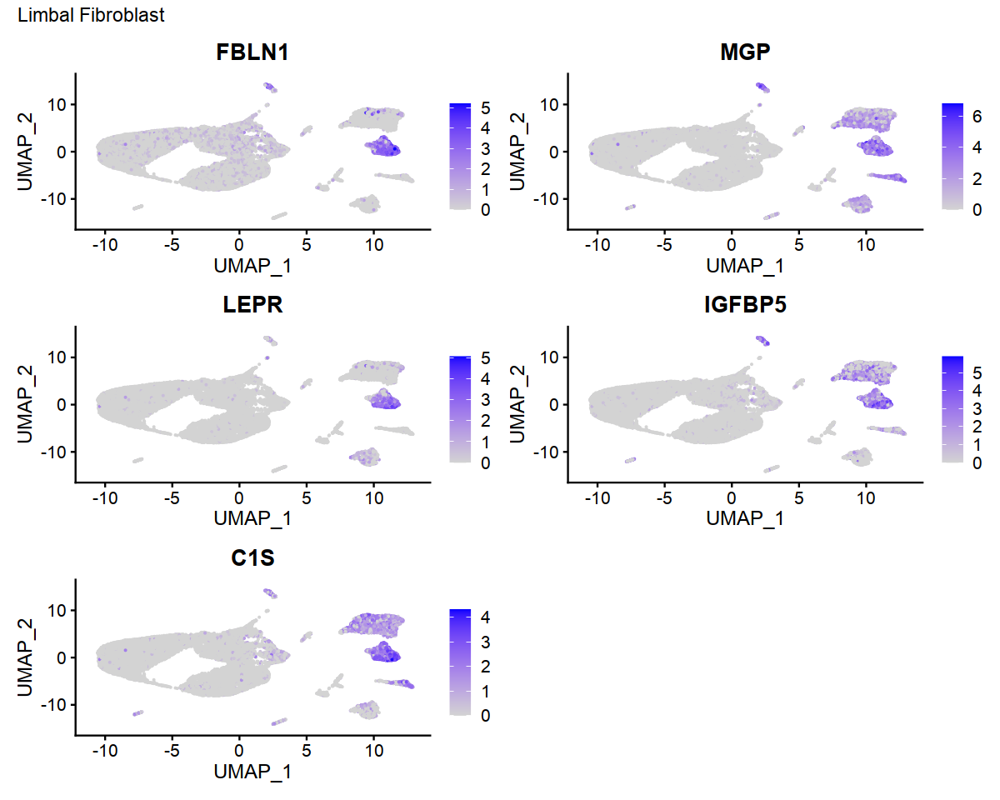

Warning message in FetchData(object = object, vars = c(dims, "ident", features), :
"The following requested variables were not found: COL3A3"


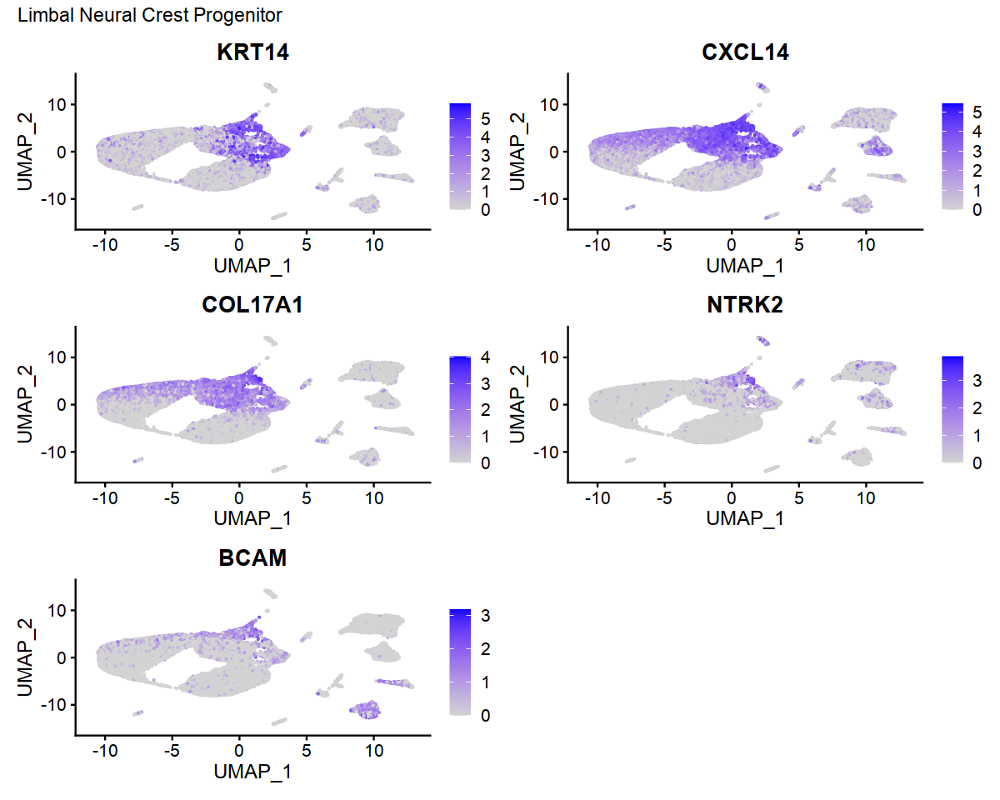

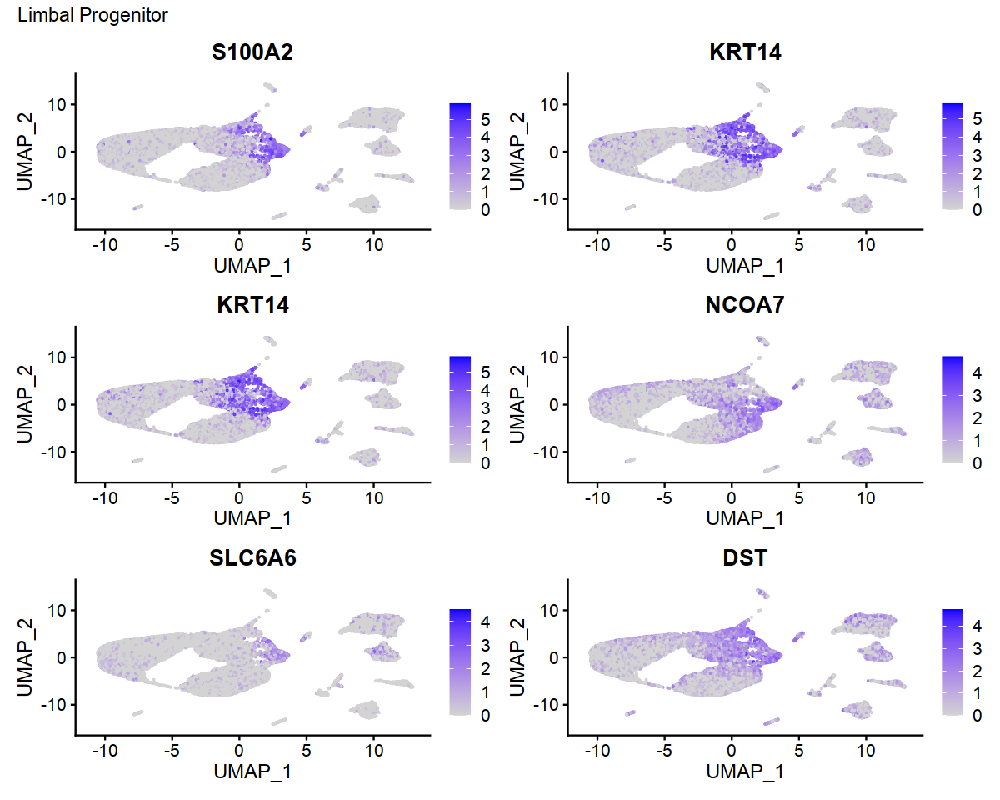

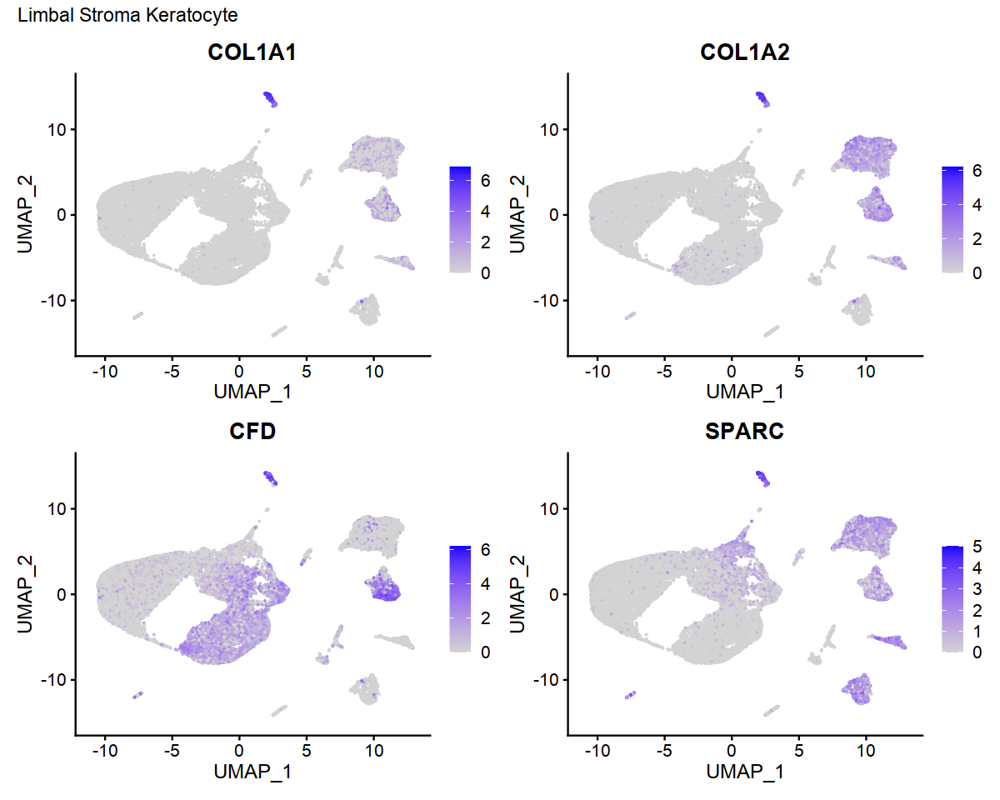

Warning message in FetchData(object = object, vars = c(dims, "ident", features), :
"The following requested variables were not found: TFP1"


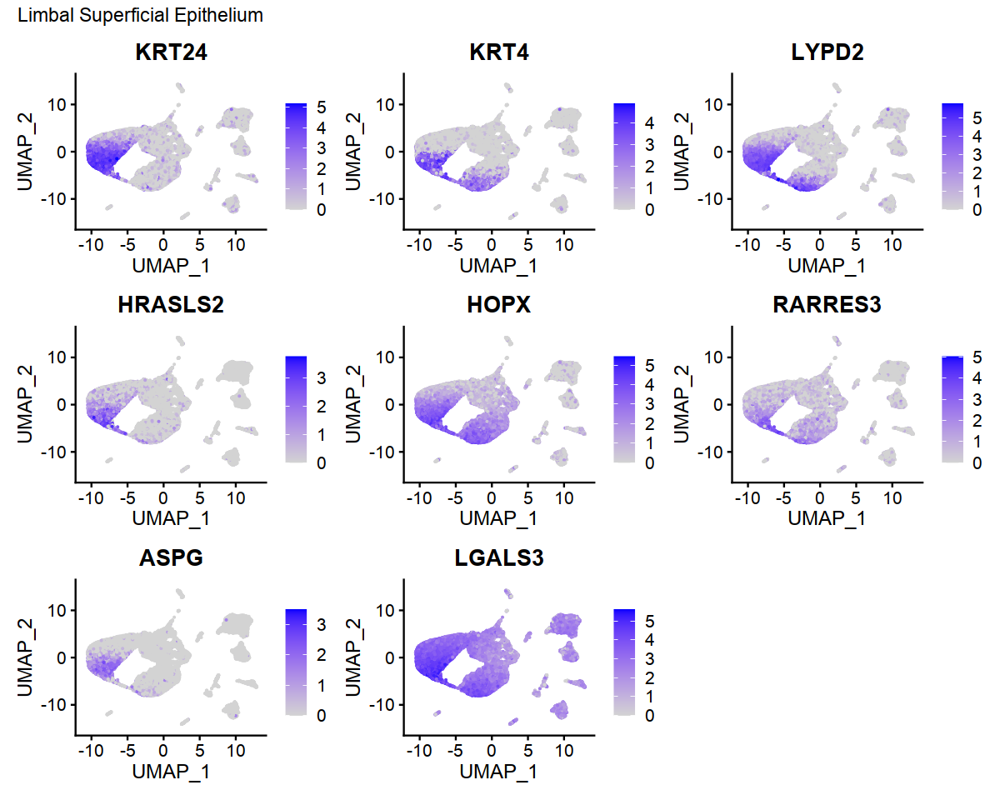

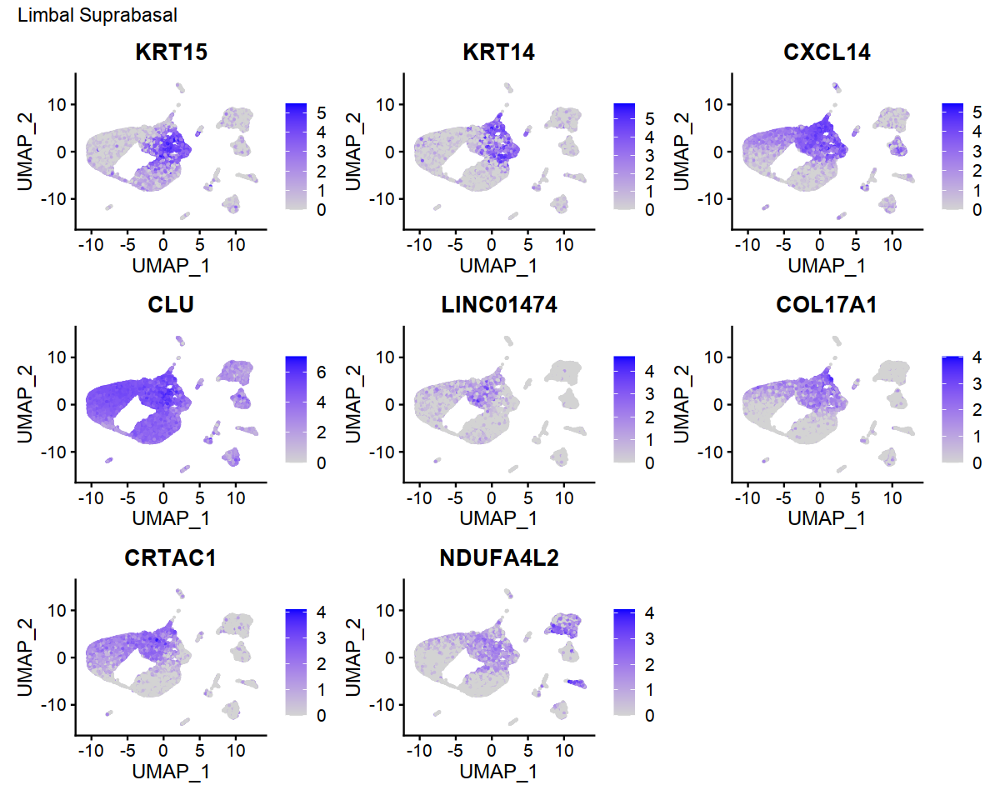

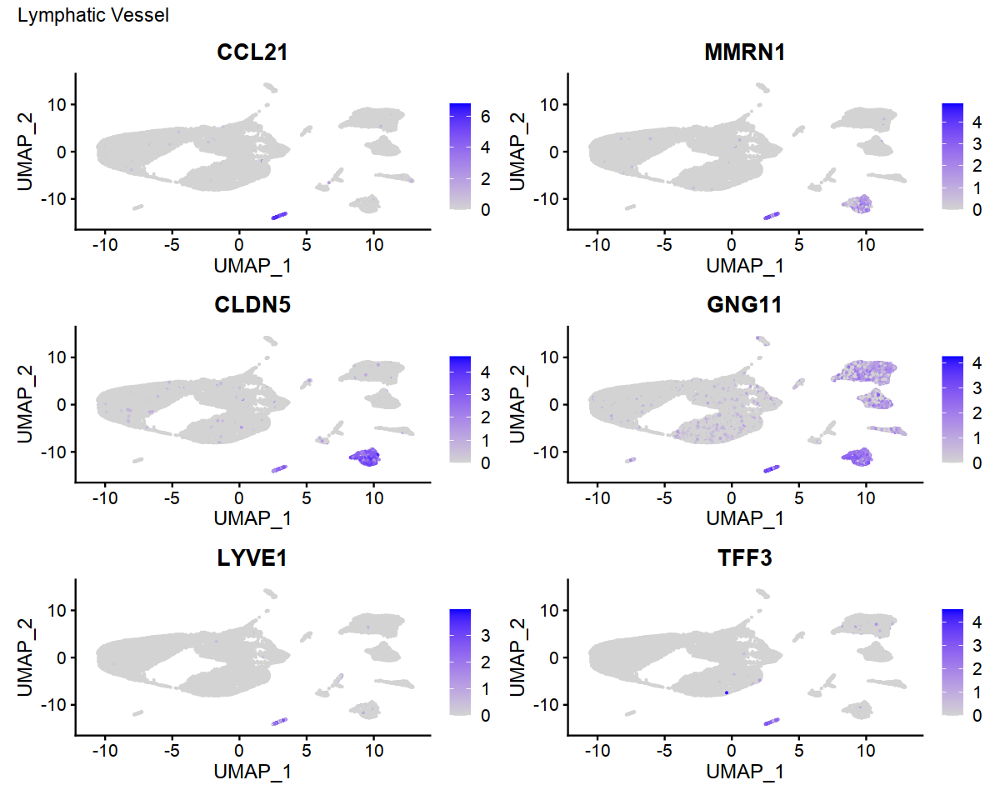

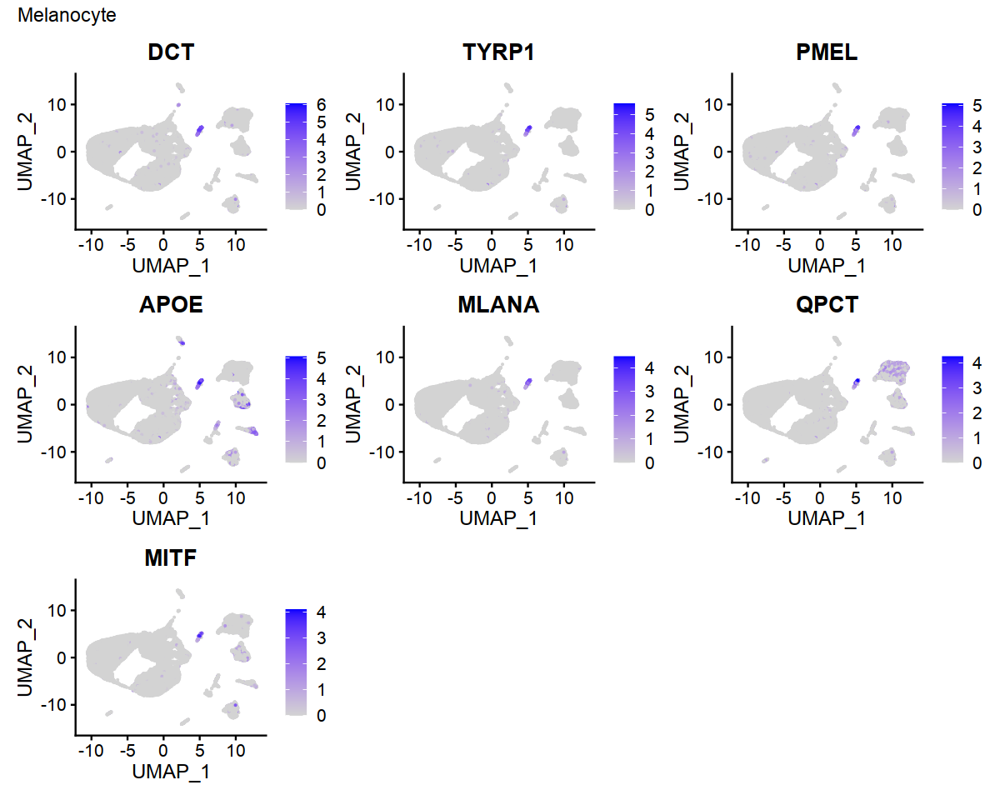

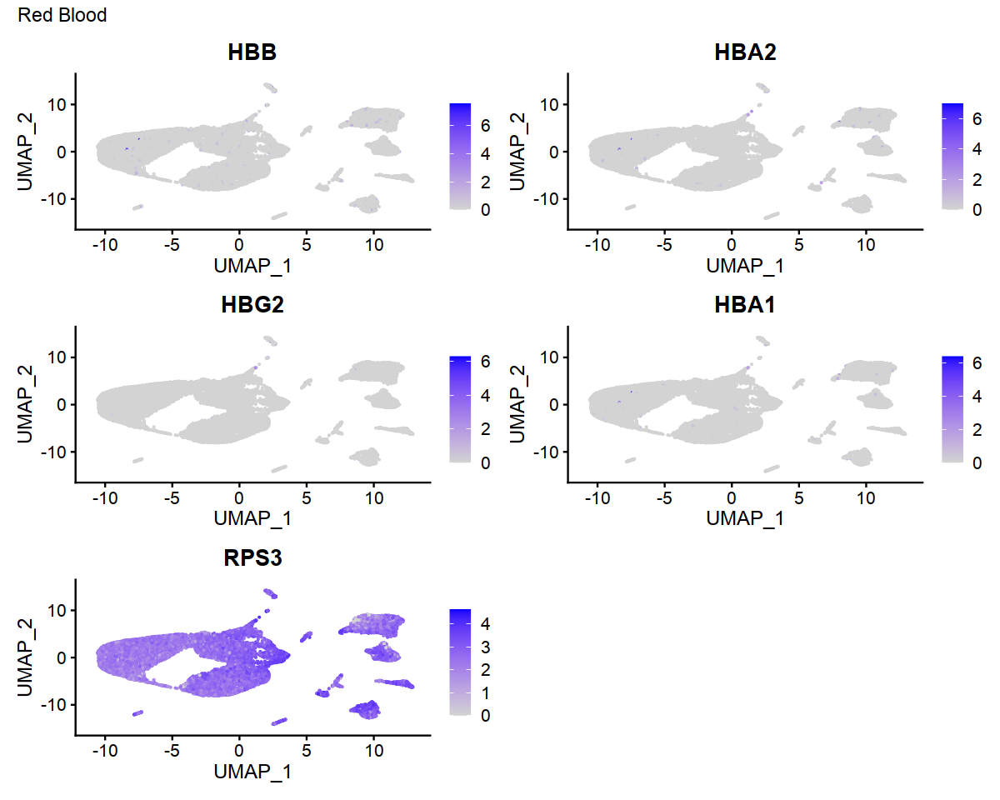

In [29]:
for(ct in names(marker_list)){
    mk = marker_list[[ct]]
    print(FeaturePlot(data_list[[1]], features = mk, slot = 'data')+plot_annotation(title=ct))
}

In [31]:
# 在paper里面发现了有关于immune cell的叙述和发现
# 所以给immune cell单独注释
extract_tmp <- data_list[[1]][, which(data_list[[1]]@meta.data[, 'curated.assign'] == 'Immune')]

In [36]:
Immune_marker_list = list()
Immune_marker_list['Monocyte'] <- list(c('IL1B','CXCL8','EREG','BCL2A1','G0S2'))
Immune_marker_list['CD8T'] <- list(c('IFNG','IL32','ISG15','CD69','XCL1','IGHG4','GZMB','CCL5','CD3D','CD2'))
Immune_marker_list['Macrophage'] <- list(c('MAFB','HSPA6','EGR1','BAG3','HSPA1B','C1QA','C1QC','CD14','C1QB','AIF1'))

In [45]:
expr = extract_tmp@assays$RNA@counts
cells <- ncol(expr)
if (cells <= 5000) {
  npc <- 50; cluster.res <- 0.6
} else if(cells <= 100000) {
  npc <- 50; cluster.res <- 1
} else {
  npc <- 100; cluster.res <- 1
}

In [49]:
object <- NormalizeData(extract_tmp, verbose = FALSE)
object <- FindVariableFeatures(object, selection.method = "vst", nfeatures = 2000, verbose = FALSE)
object <- ScaleData(object, verbose = FALSE)
object <- RunPCA(object, npcs = npc, verbose = FALSE, features = VariableFeatures(object)) 
pc.contribution <- object@reductions$pca@stdev / sum(object@reductions$pca@stdev) * 100
pc.contribution.cum <- cumsum(pc.contribution)
pc.first <- which(pc.contribution.cum > 75)[1]
dims.use <- 1:pc.first
object <- RunUMAP(object, reduction = "pca", dims = dims.use, verbose = FALSE) %>%
    FindNeighbors(reduction = "pca", dims = dims.use, verbose = FALSE) %>%
    FindClusters(resolution = cluster.res, verbose = FALSE)

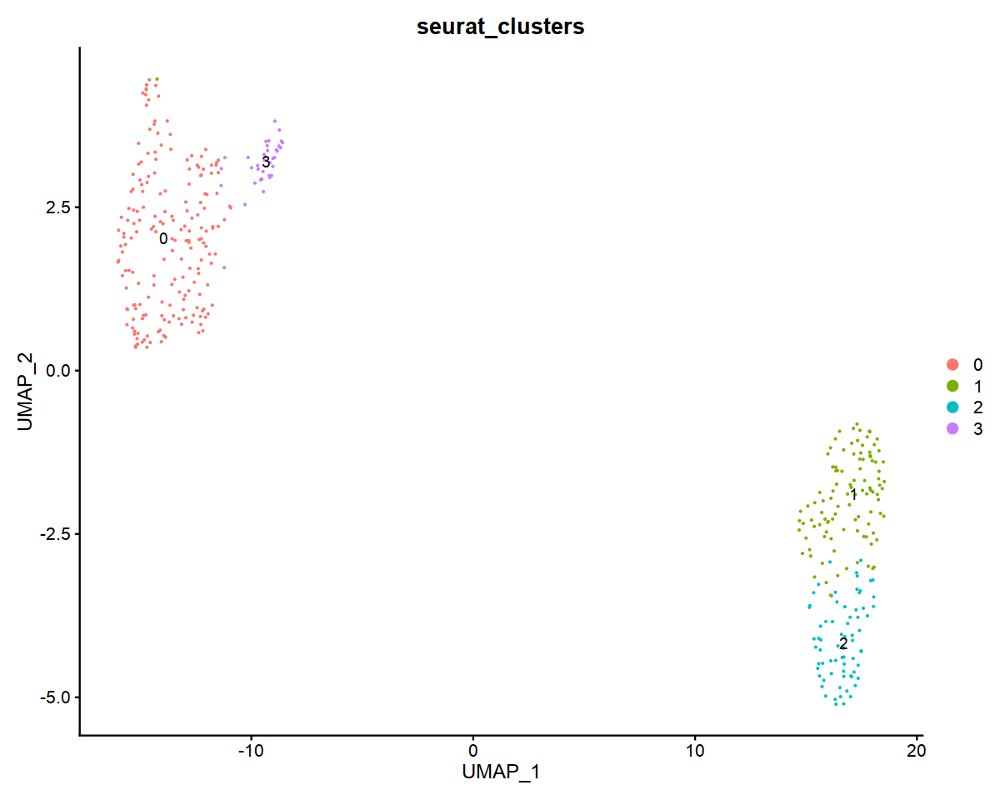

In [52]:
options(repr.plot.height=8,repr.plot.width=10)
DimPlot(object, group.by='seurat_clusters', label = TRUE, pt.size = 0.1)

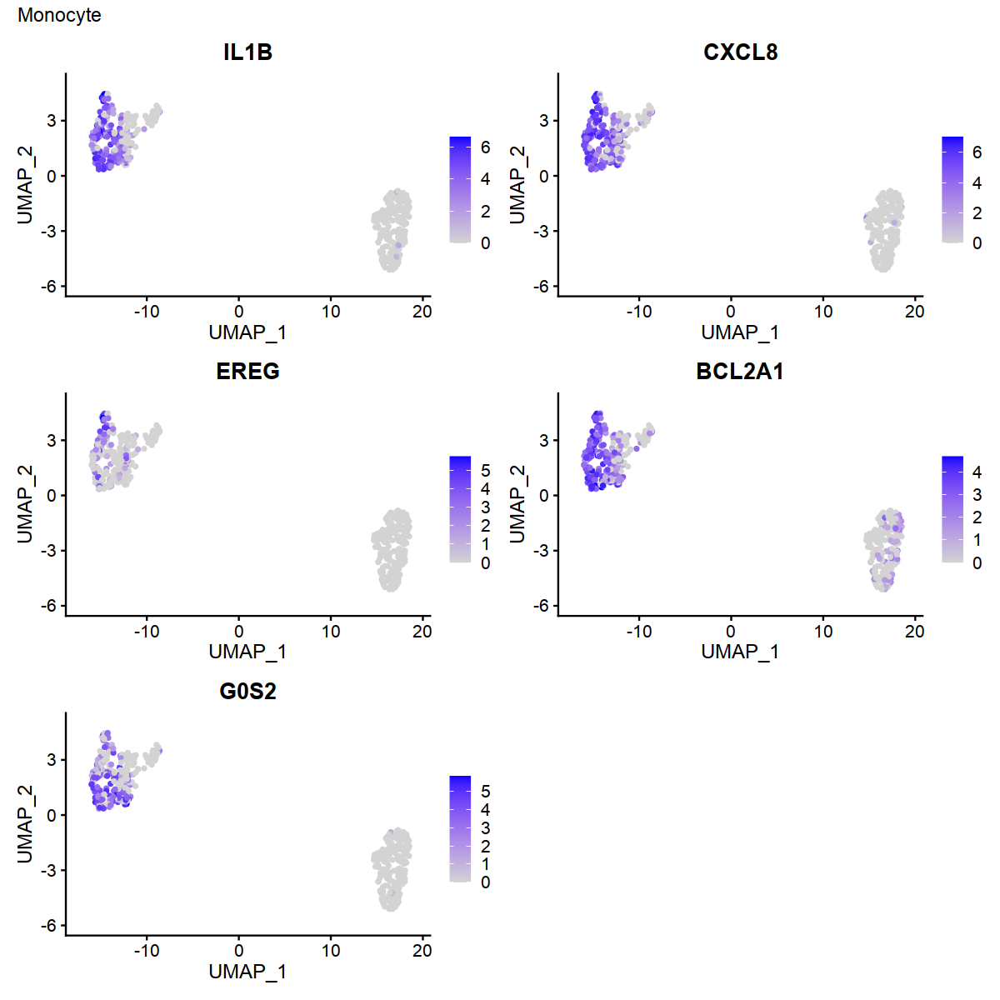

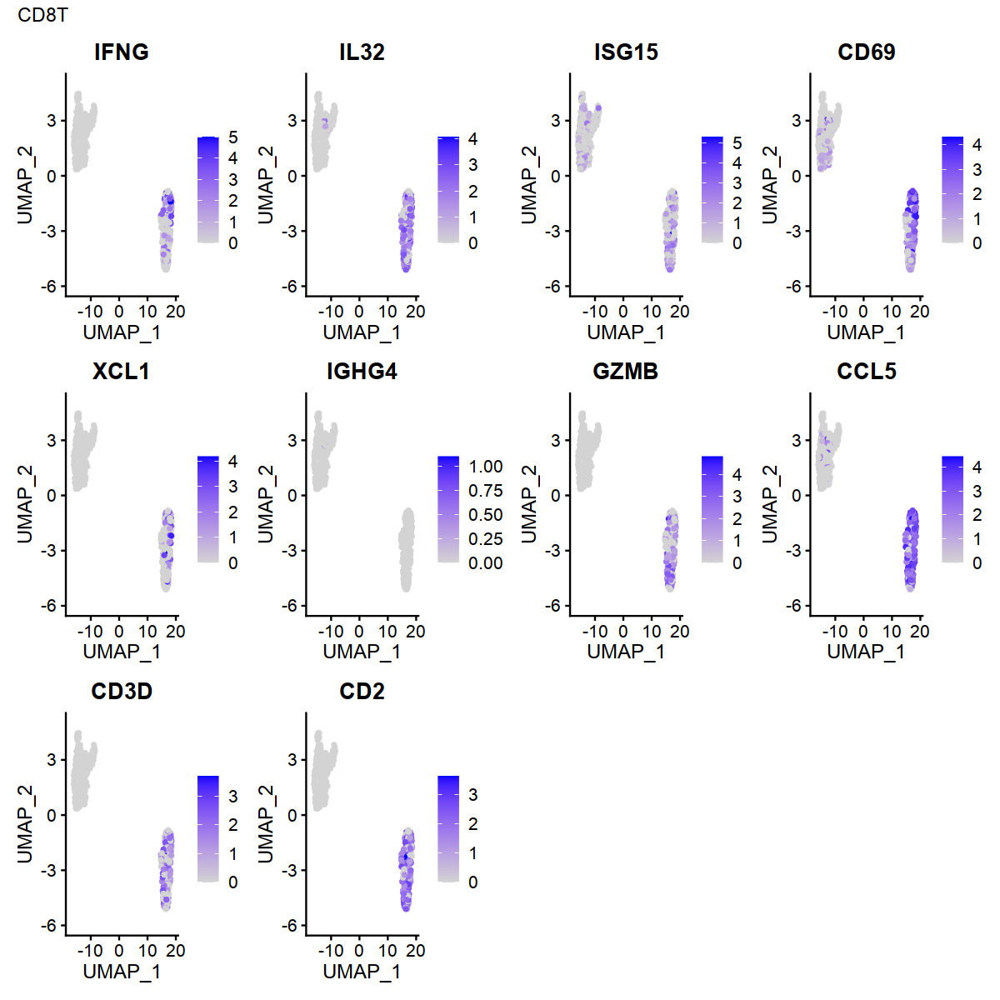

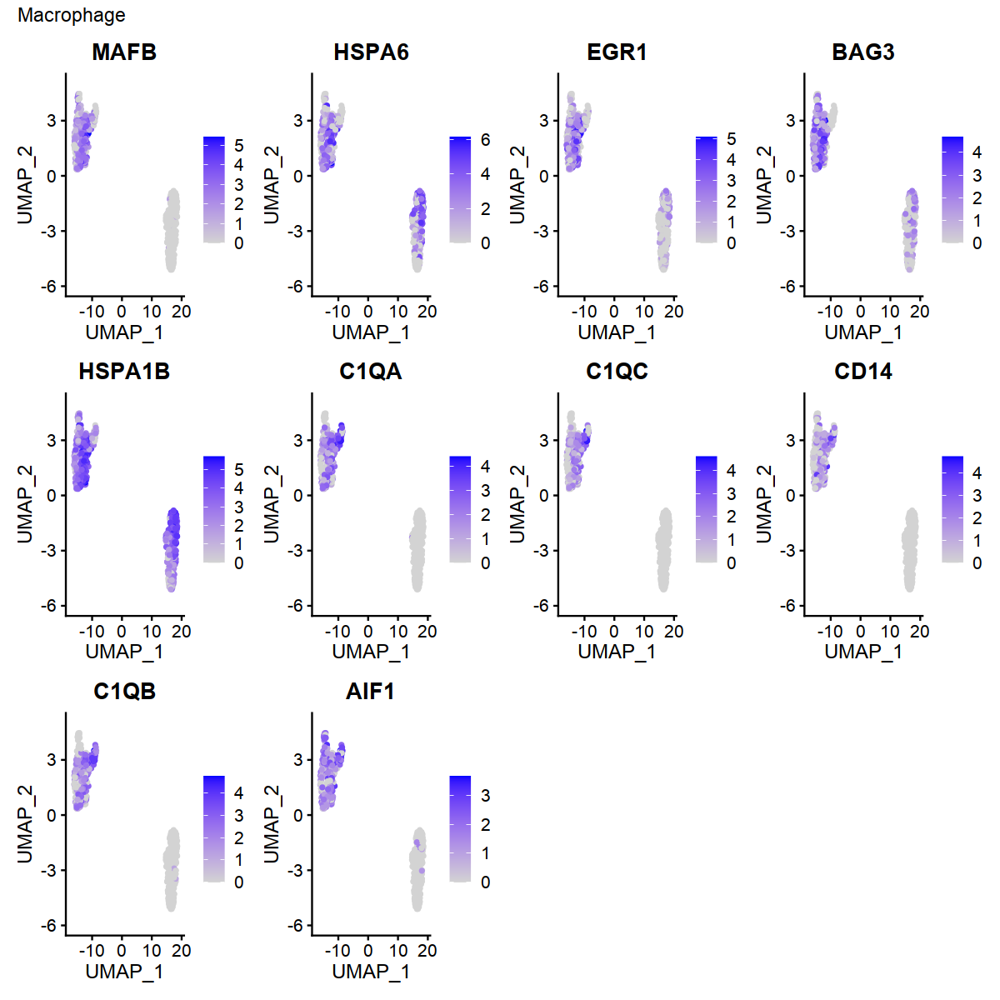

In [54]:
options(repr.plot.height=10,repr.plot.width=10)
for(ct in names(Immune_marker_list)){
    mk = Immune_marker_list[[ct]]
    print(FeaturePlot(object, features = mk, slot = 'data')+plot_annotation(title=ct))
}

In [55]:
Immune_marker_list

$Monocyte
[1] "IL1B"   "CXCL8"  "EREG"   "BCL2A1" "G0S2"  

$CD8T
 [1] "IFNG"  "IL32"  "ISG15" "CD69"  "XCL1"  "IGHG4" "GZMB"  "CCL5"  "CD3D" 
[10] "CD2"  

$Macrophage
 [1] "MAFB"   "HSPA6"  "EGR1"   "BAG3"   "HSPA1B" "C1QA"   "C1QC"   "CD14"  
 [9] "C1QB"   "AIF1"

Warning message in FetchData(object = object, vars = c(dims, "ident", features), :
"The following requested variables were not found: CD3"


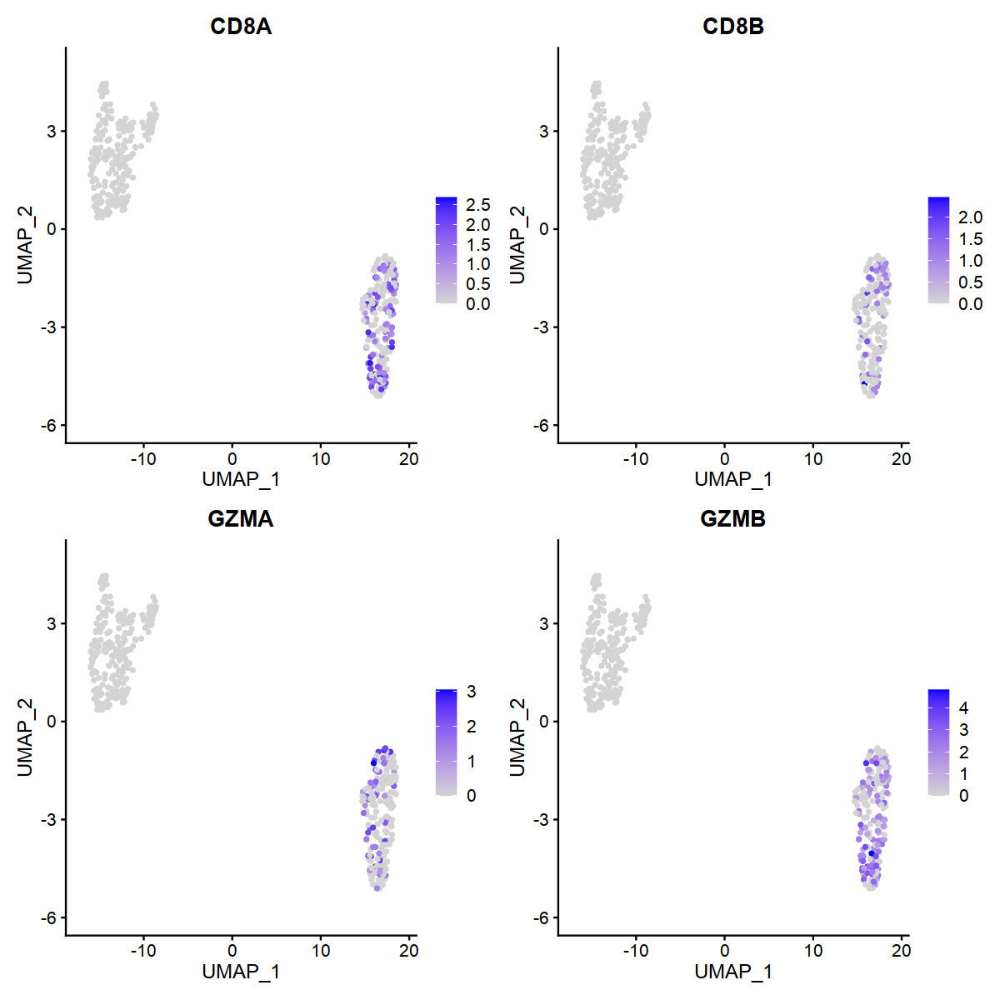

In [56]:
FeaturePlot(object, features = c('CD3', 'CD8A', 'CD8B', 'GZMA', 'GZMB'), slot = 'data')

In [57]:
object$curated.assign[which(object$seurat_clusters %in% c(0))] = 'Monocyte'
object$curated.assign[which(object$seurat_clusters %in% c(1,2))] = 'CD8T'
object$curated.assign[which(object$seurat_clusters %in% c(3))] = 'Macrophage'

Then get the annotated barcode and modify the original annotation

In [65]:
for(ct in names(Immune_marker_list)){
    data_list[[1]]$curated.assign[match(colnames(object)[object$curated.assign == ct], colnames(data_list[[1]]))] <- ct
}

In [67]:
sort(unique(data_list[[1]]$curated.assign))

[1] "Blood Vesel"                      "CD8T"                            
 [3] "Conjunctival Basal Epithelium"    "Corneal Basal Epithelium"        
 [5] "Corneal Endothelium"              "Corneal Stromal"                 
 [7] "Fibroblastic Corneal Endothelial" "Limbal Fibroblast"               
 [9] "Limbal Neural Crest Progenitor"   "Limbal Progenitor"               
[11] "Limbal Stroma Keratocyte"         "Limbal Superficial Epithelium"   
[13] "Limbal Suprabasal"                "Lymphatic Vessel"                
[15] "Macrophage"                       "Melanocyte"                      
[17] "Monocyte"

## GSE157474

原文有介绍说：Immune cells (∼2.4%), containing T and NKT cells (expressing CD3D and KLRB1), macrophage and monocytes (expressing ITGAM and CD14), and dendritic cells (expressing CCR7, CD83 and ITGAX) were distributed in Cluster 8 and 12 

In [71]:
# c('T/NKT','Macrophage/Monocyte','DC')

In [93]:
# 在paper里面发现了有关于immune cell的叙述和发现
# 所以给immune cell单独注释
immune_GSE157474 <- data_list[[2]][, which(data_list[[2]]@meta.data[,'curated.assign'] == 'Immune')]

In [94]:
Immune_marker_GSE157474_list = list()
Immune_marker_GSE157474_list['T/NKT'] <- list(c('CD3D','KLRB1'))
Immune_marker_GSE157474_list['Macrophage/Monocyte'] <- list(c('ITGAM','CD14'))
Immune_marker_GSE157474_list['DC'] <- list(c('CCR7','CD83','ITGAX'))

In [95]:
cells <- ncol(immune_GSE157474)
if (cells <= 5000) {
  npc <- 50; cluster.res <- 0.6
} else if(cells <= 100000) {
  npc <- 50; cluster.res <- 1
} else {
  npc <- 100; cluster.res <- 1
}

In [96]:
object <- NormalizeData(immune_GSE157474, verbose = FALSE)
object <- FindVariableFeatures(object, selection.method = "vst", nfeatures = 2000, verbose = FALSE)
object <- ScaleData(object, verbose = FALSE)
object <- RunPCA(object, npcs = npc, verbose = FALSE, features = VariableFeatures(object)) 
pc.contribution <- object@reductions$pca@stdev / sum(object@reductions$pca@stdev) * 100
pc.contribution.cum <- cumsum(pc.contribution)
pc.first <- which(pc.contribution.cum > 75)[1]
dims.use <- 1:pc.first
object <- RunUMAP(object, reduction = "pca", dims = dims.use, verbose = FALSE) %>%
    FindNeighbors(reduction = "pca", dims = dims.use, verbose = FALSE) %>%
    FindClusters(resolution = cluster.res, verbose = FALSE)

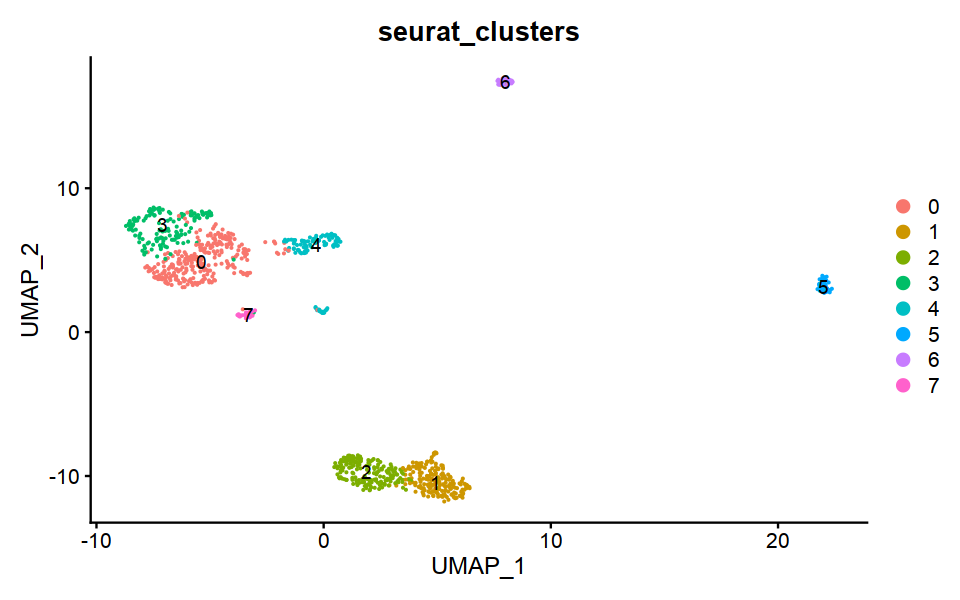

In [97]:
options(repr.plot.height=5,repr.plot.width=8)
DimPlot(object, group.by='seurat_clusters', label = TRUE, pt.size = 0.1)

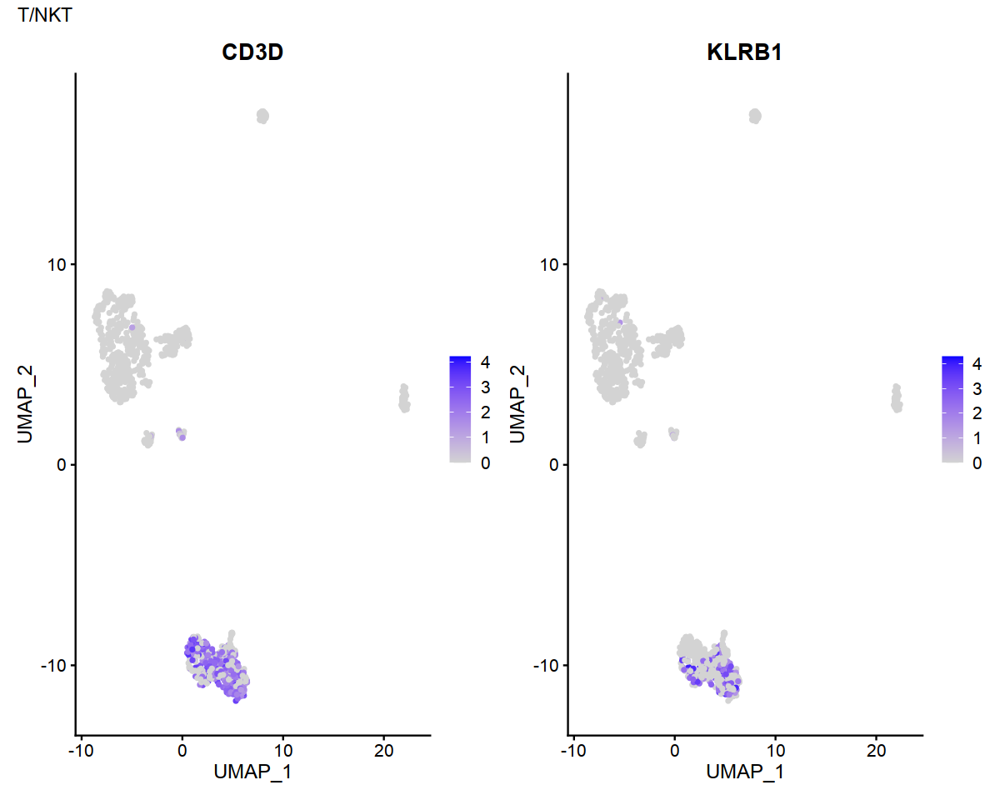

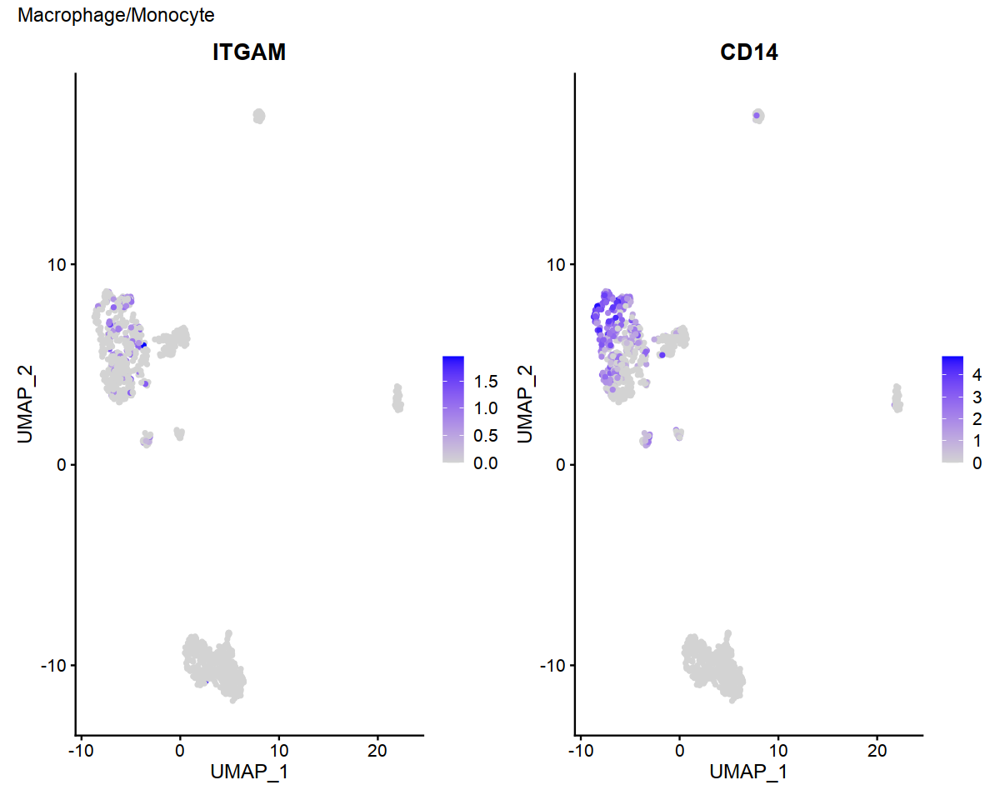

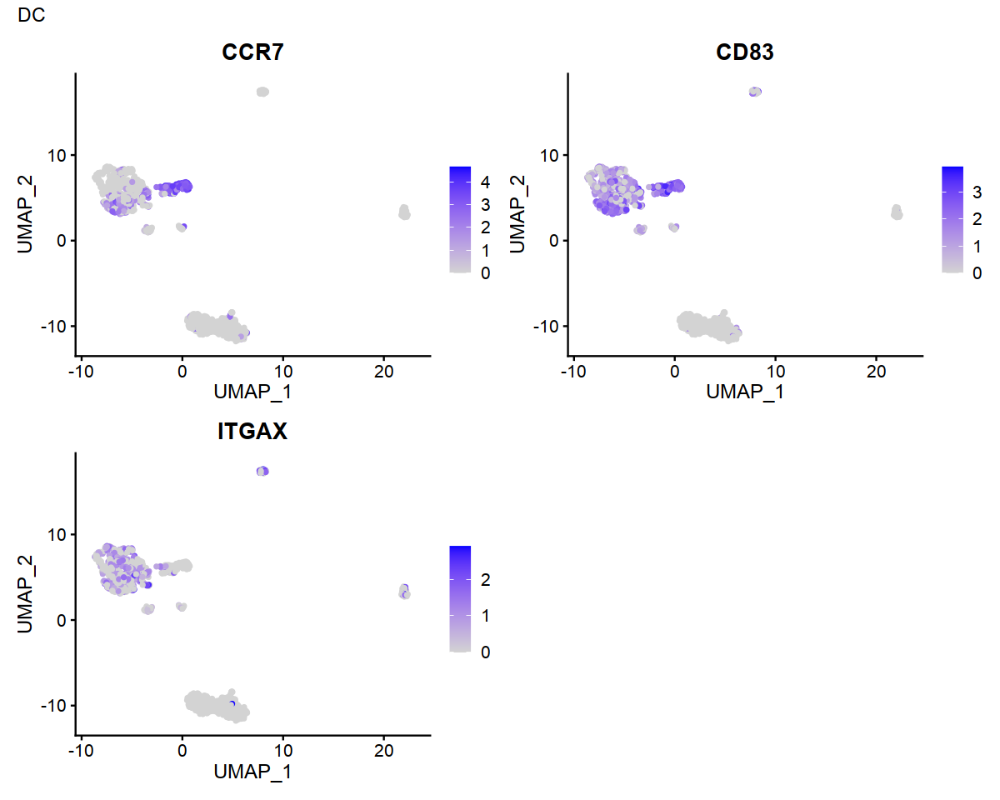

In [99]:
options(repr.plot.height=8,repr.plot.width=10)
for(ct in names(Immune_marker_GSE157474_list)){
    mk = Immune_marker_GSE157474_list[[ct]]
    print(FeaturePlot(object, features = mk, slot = 'data')+plot_annotation(title=ct))
}

In [100]:
object$curated.assign[which(object$seurat_clusters %in% c(1,2))] = 'T/NKT'
object$curated.assign[which(object$seurat_clusters %in% c(0,3))] = 'Macrophage/Monocyte'
object$curated.assign[which(object$seurat_clusters %in% c(4,6,5,7))] = 'DC'

In [101]:
for(ct in names(Immune_marker_GSE157474_list)){
    data_list[[2]]$curated.assign[match(colnames(object)[object$curated.assign == ct], colnames(data_list[[2]]))] <- ct
}

In [105]:
sort(unique(data_list[[2]]$curated.assign))

[1] "DC"                    "Limbal Epithelial"     "Lymphatic Endothelial"
 [4] "Macrophage/Monocyte"   "Melanocyte"            "Pericyte"             
 [7] "Schwann"               "Stromal"               "T/NKT"                
[10] "Vascular Endothelial"

## GSE169047

In [152]:
marker_path = '/fs/home/shixiaoying/HUSCH2/GSE169047/processed/MAESTRO/GSE169047_Marker.txt'
Marker <- read.table(marker_path, sep = "\t", stringsAsFactors = F, header = T)

In [153]:
marker_list <- list()
for (i in 1:nrow(Marker)) {
    marker_list[Marker$Celltype[i]] <- list(unique(strsplit(Marker$Marker[i], ",")[[1]]))
}


In [154]:
marker_list

$Rod
[1] "PDE6A"

$Cone
[1] "ARR3"

$`Cone off BC`
[1] "GRIK1" "ERBB4"

$`Cone on BC`
[1] "GRM6"

$`Rod BC`
[1] "GRM6"  "PRKCA"

$RGC
[1] "PRPH"

$Amacirne
[1] "GAD1"

$Horizontal
[1] "ONECUT2"

$Muller
[1] "RLBP1"

$Astrocyte
[1] "GFAP"

$Microglia
[1] "C1QA"

$Pericyte
[1] "RGS5"

$Endothelial
[1] "RGS5" "VWF"

In [16]:
tmp = names(marker_list)
tmp <- gsub('s$','',tmp)
tmp <- gsub(" cell$", "",tmp, ignore.case = T)
tmp <- gsub("  ", " ", tmp, ignore.case = T)
tmp <- sapply(tmp, simpleCap)
names(marker_list) <- tmp

In [18]:
DefaultAssay(data_list[[3]]) <- 'RNA'

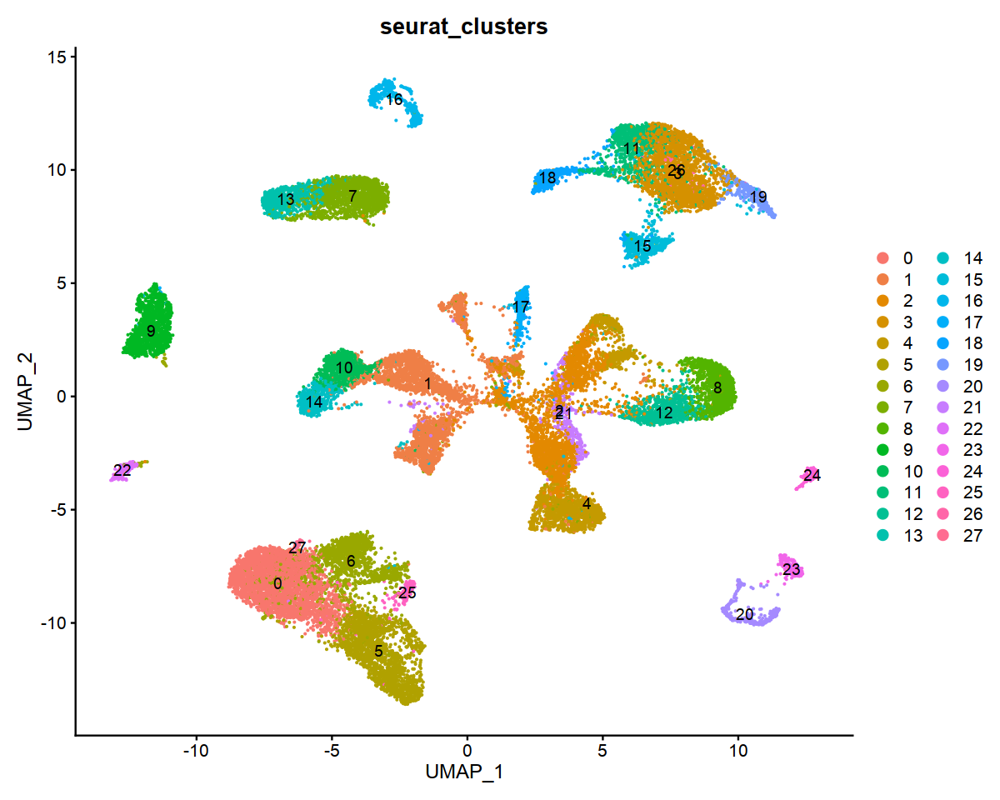

In [19]:
options(repr.plot.height=8,repr.plot.width=10)
DimPlot(data_list[[3]], group.by='seurat_clusters', label = TRUE, pt.size = 0.1)

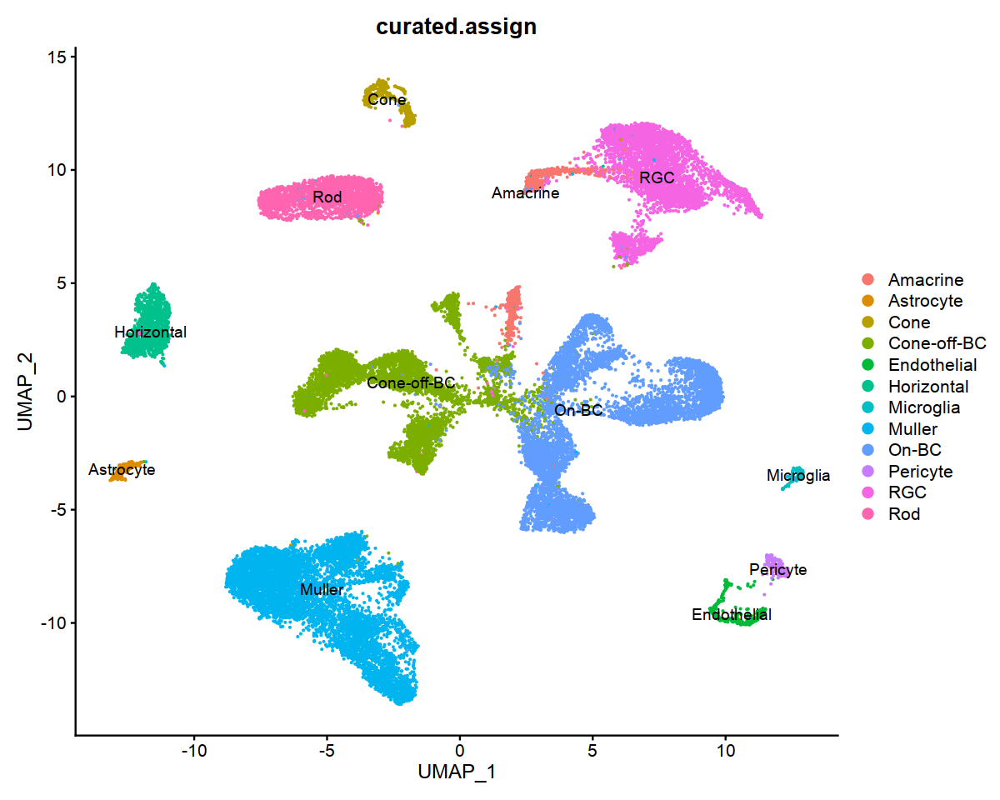

In [20]:
DimPlot(data_list[[3]], group.by='curated.assign', label = TRUE, pt.size = 0.1)

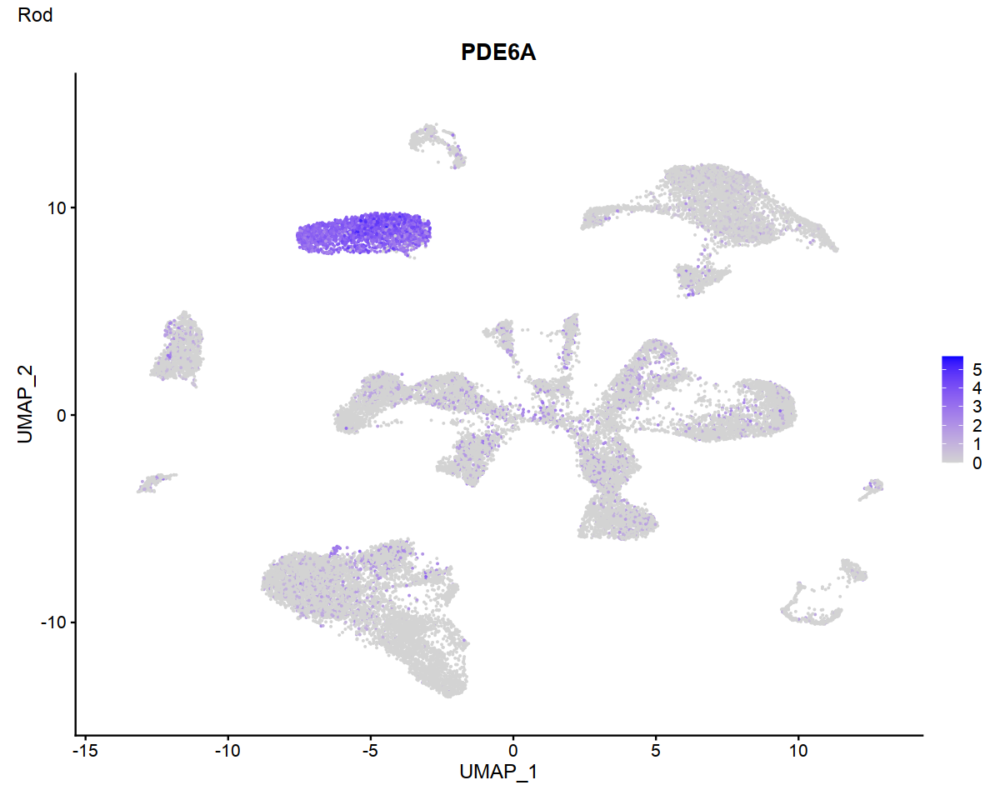

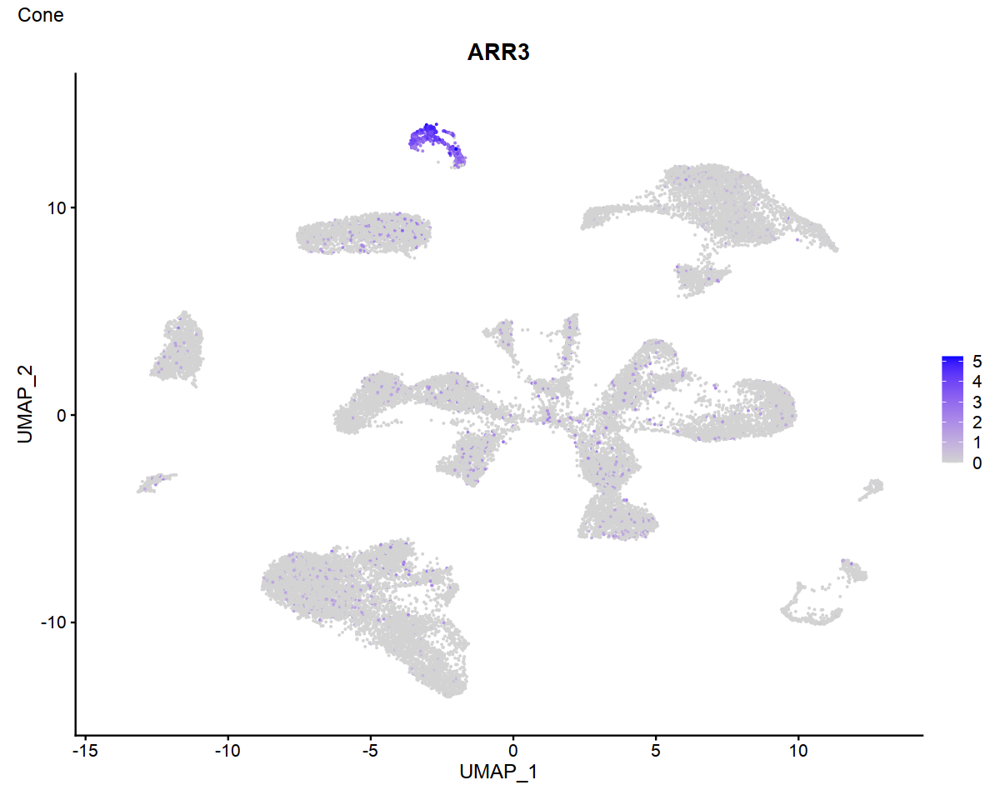

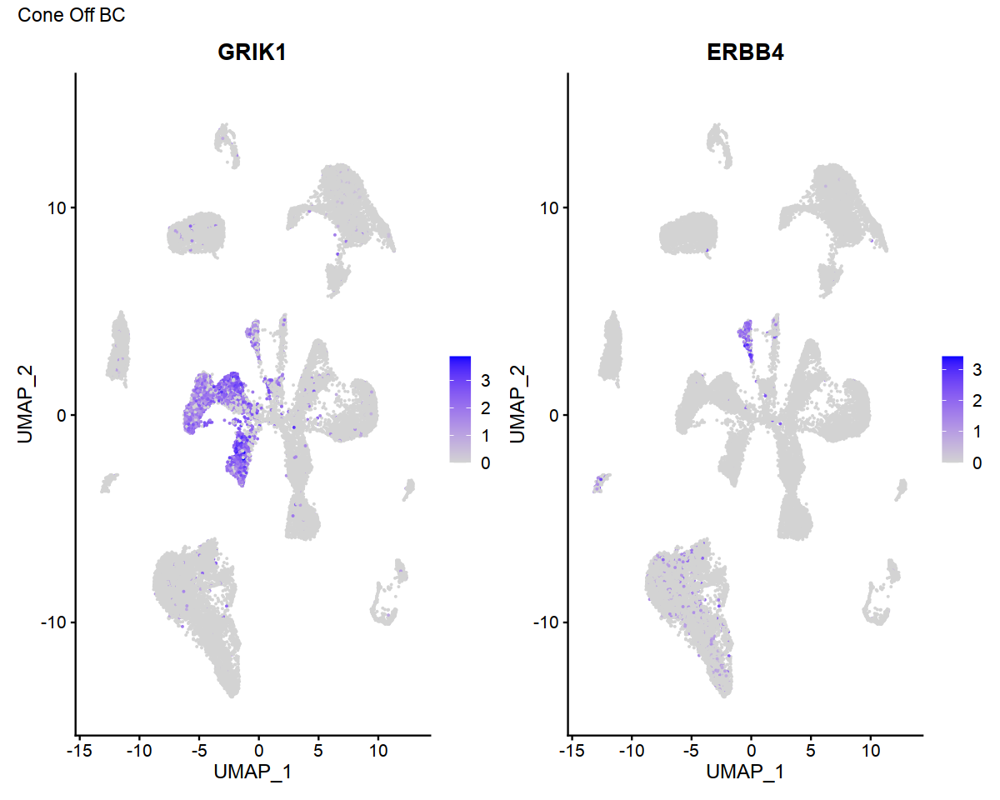

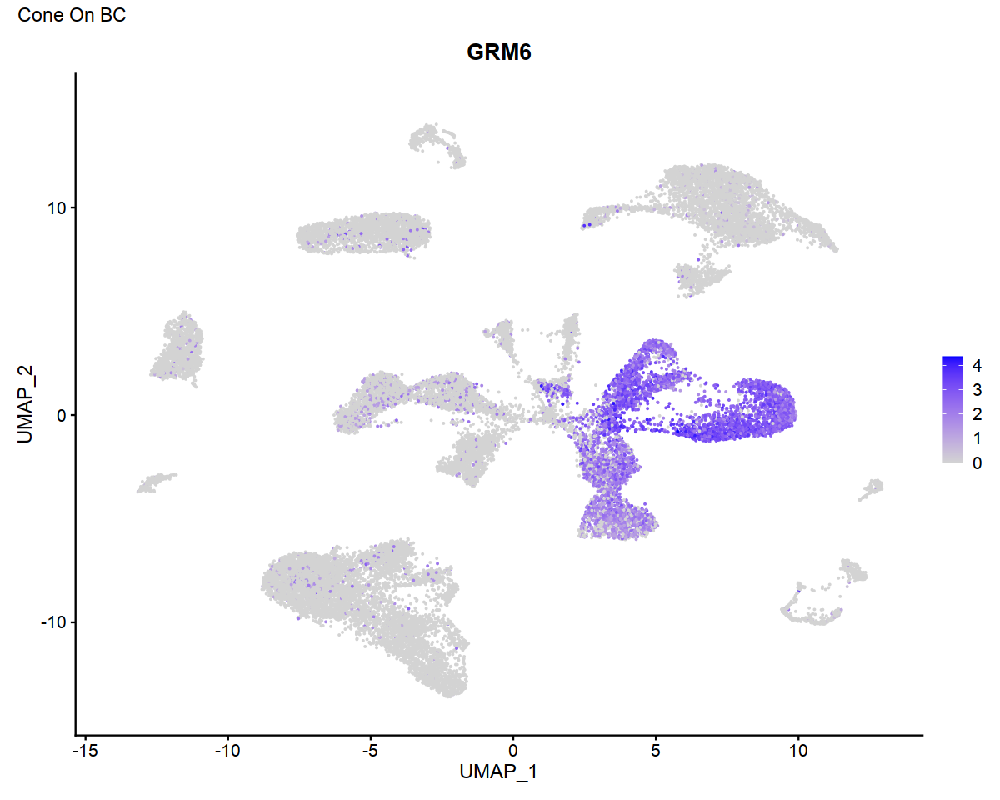

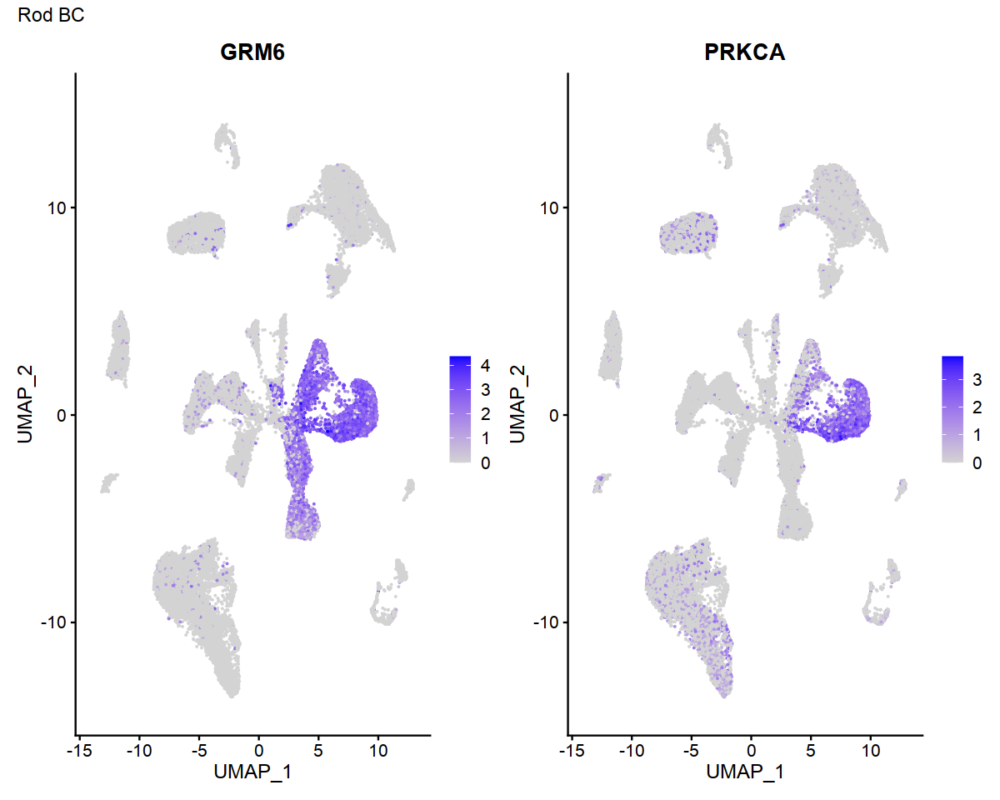

...

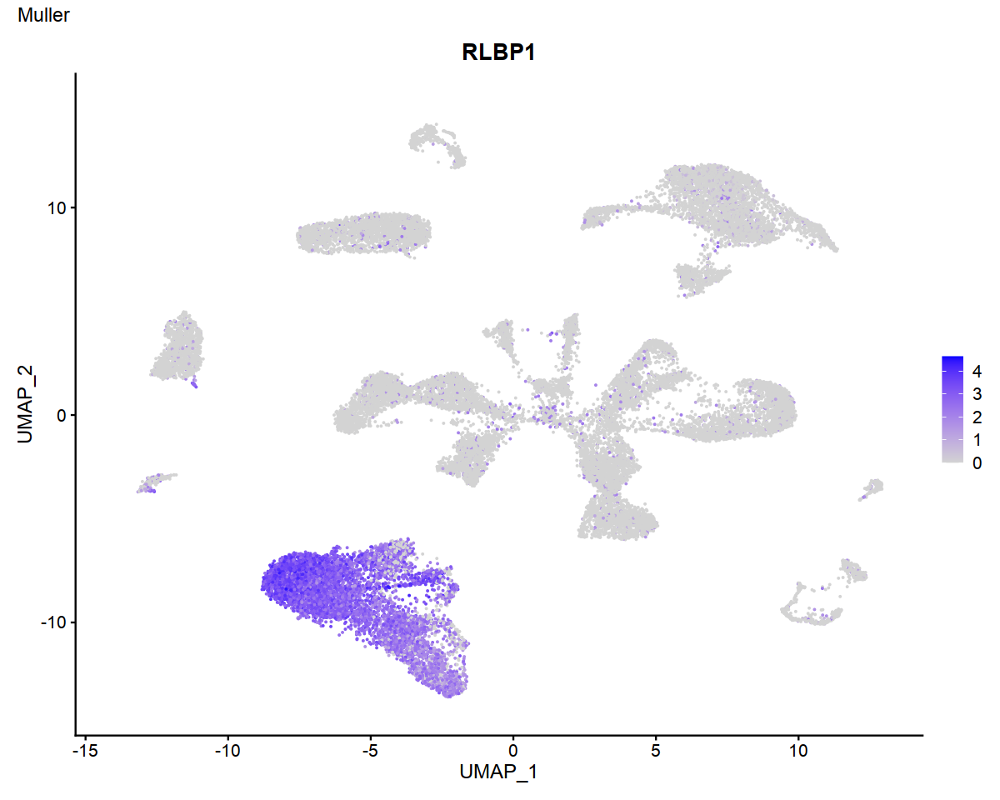

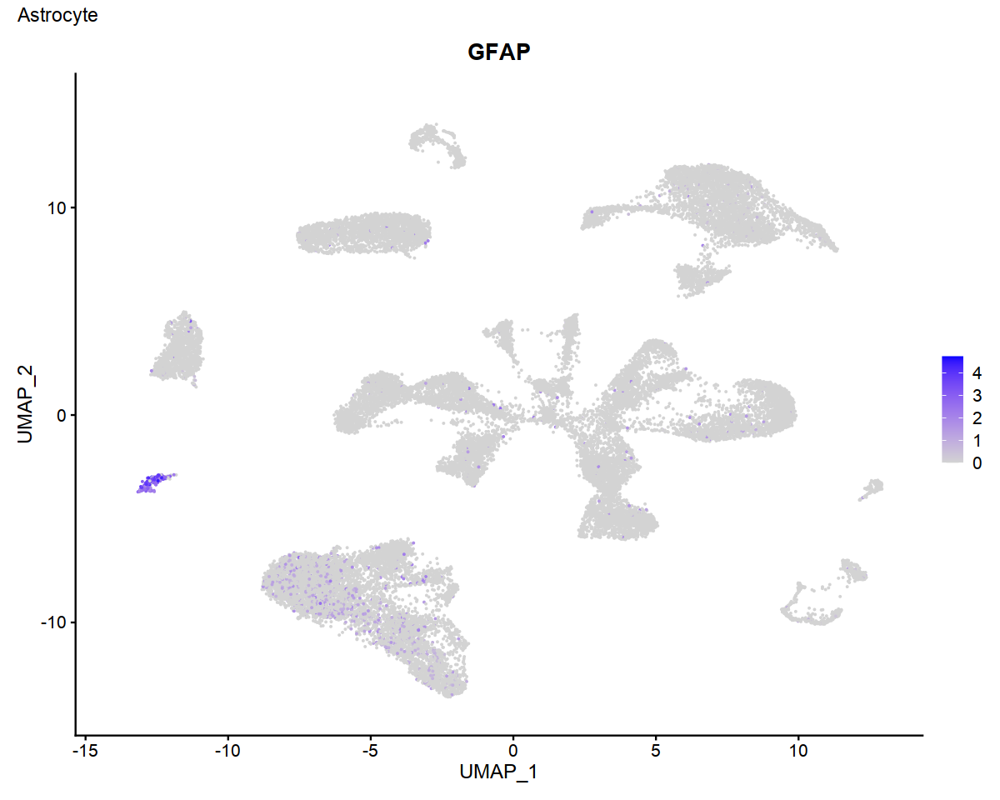

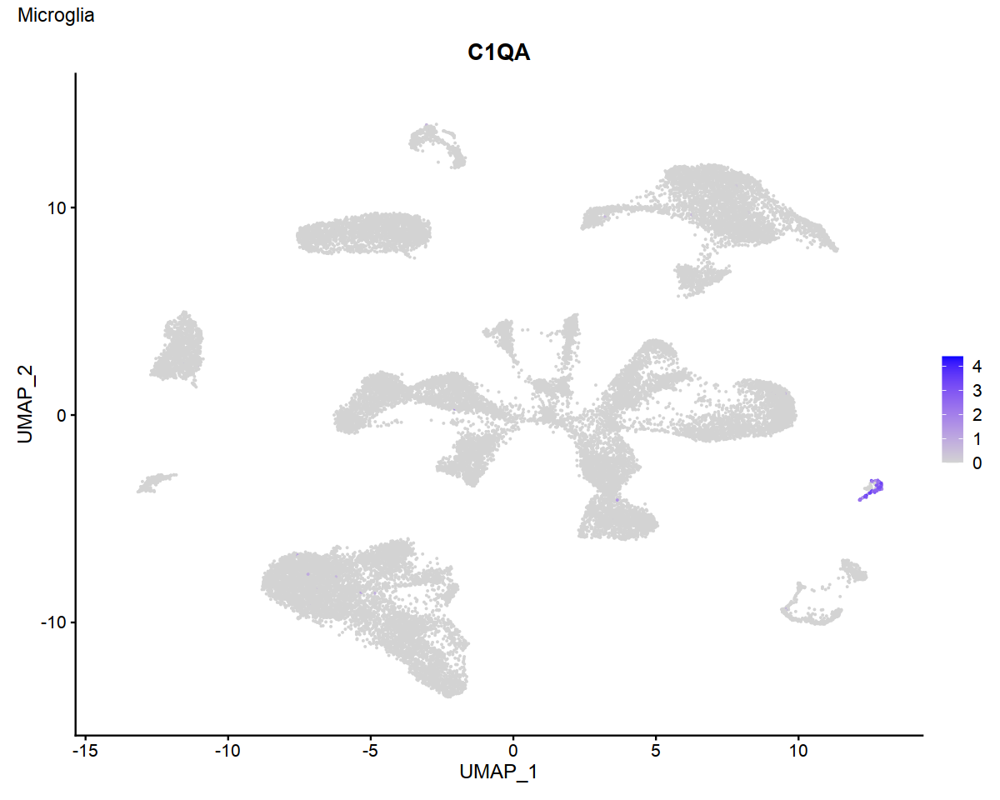

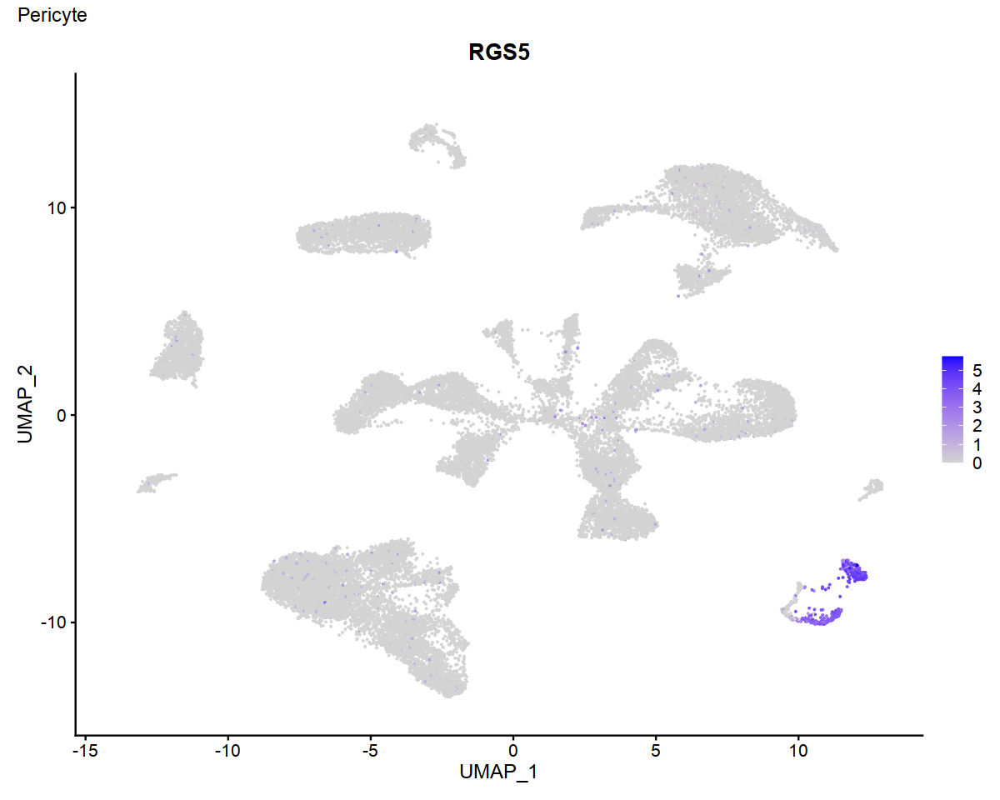

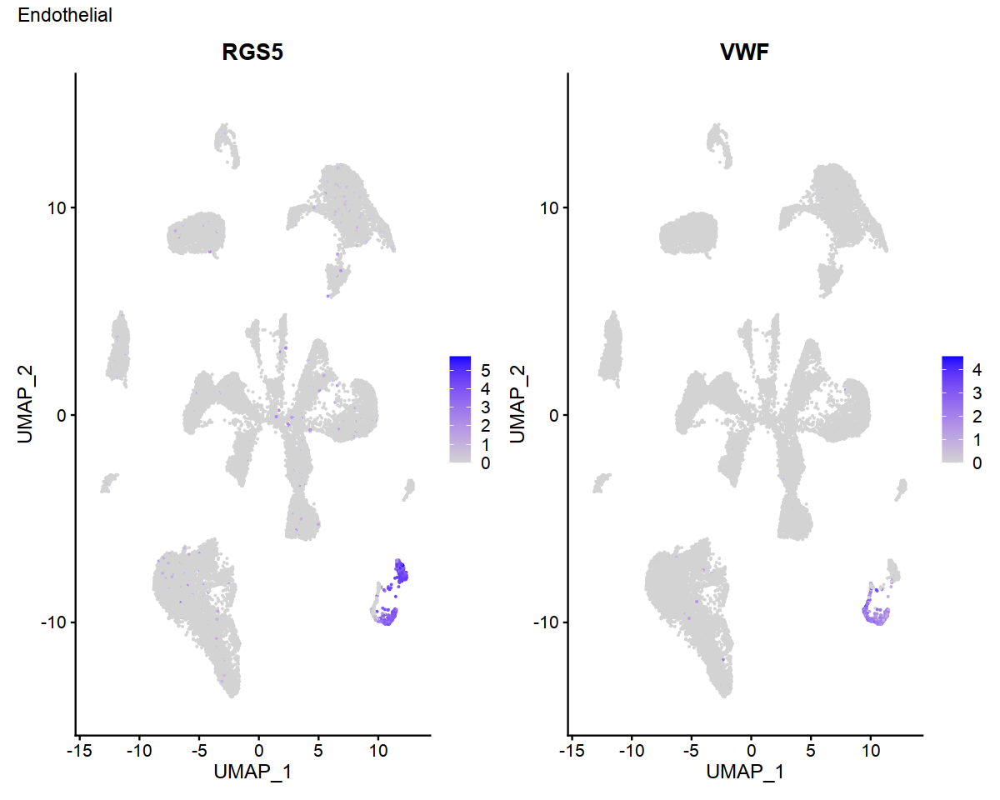

In [21]:
for(ct in names(marker_list)){
    mk = marker_list[[ct]]
    print(FeaturePlot(data_list[[3]], features = mk, slot = 'data')+plot_annotation(title=ct))
}

In [23]:
# wrong clusters
data_list[[3]]$seurat_clusters[which(data_list[[3]]$curated.assign == 'On-BC')]


去除批次效应之后，注释结果没有改过来= =需要重改，这个可以通过是否每个cluster内细胞类型一样来判断

In [15]:
data_list[[3]]$curated.assign = 'assign'
data_list[[3]]$curated.assign[which(data_list[[3]]$seurat_clusters %in% c(7,13))] = 'Rod'
data_list[[3]]$curated.assign[which(data_list[[3]]$seurat_clusters %in% c(16))] = 'Cone'
data_list[[3]]$curated.assign[which(data_list[[3]]$seurat_clusters %in% c(1,10,14))] = 'Cone Off BC'
data_list[[3]]$curated.assign[which(data_list[[3]]$seurat_clusters %in% c(2,4,8,12,21))] = 'Cone On BC/Rod BC_Unknown'
data_list[[3]]$curated.assign[which(data_list[[3]]$seurat_clusters %in% c(3,11,15,19,26,18))] = 'RGC'
data_list[[3]]$curated.assign[which(data_list[[3]]$seurat_clusters %in% c(17))] = 'Amacirne'
data_list[[3]]$curated.assign[which(data_list[[3]]$seurat_clusters %in% c(9))] = 'Horizontal'
data_list[[3]]$curated.assign[which(data_list[[3]]$seurat_clusters %in% c(0,5,6,25,27))] = 'Muller'
data_list[[3]]$curated.assign[which(data_list[[3]]$seurat_clusters %in% c(22))] = 'Astrocyte'
data_list[[3]]$curated.assign[which(data_list[[3]]$seurat_clusters %in% c(24))] = 'Microglia'
data_list[[3]]$curated.assign[which(data_list[[3]]$seurat_clusters %in% c(20,23))] = 'Pericyte/Endothelial_Unknown'


In [16]:
# abbr => full
data_list[[3]]$curated.assign[which(data_list[[3]]$curated.assign == 'RGC')] = 'Retinal Ganglion'

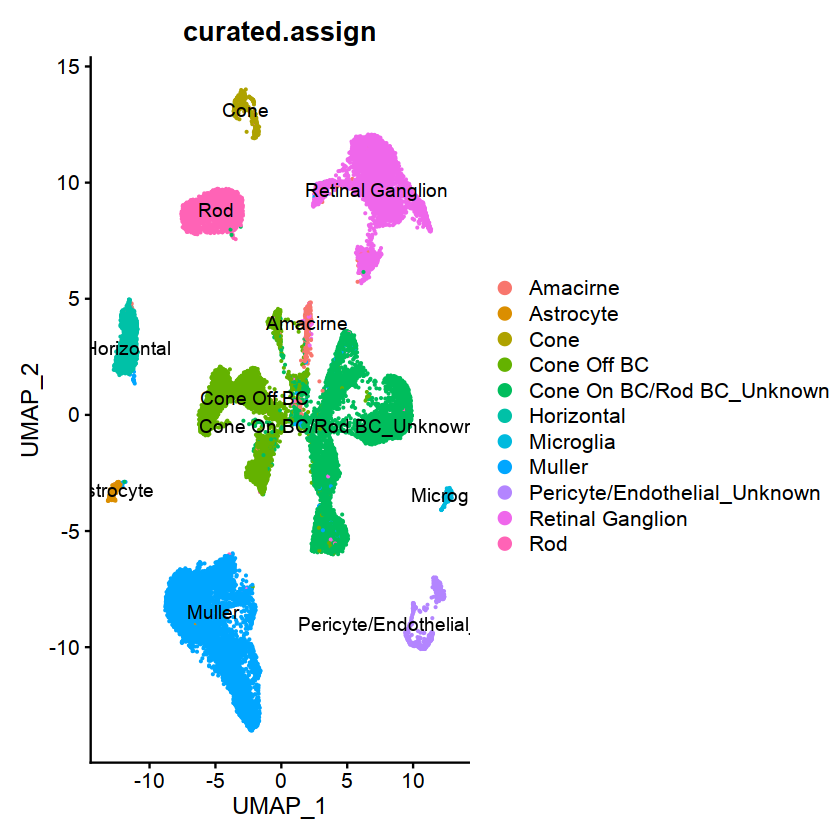

In [17]:
DimPlot(data_list[[3]], group.by='curated.assign', label = TRUE, pt.size = 0.1)

In [108]:
# for checking cell type (human reading)
allLevel4CT <- c()
for (i in 1:length(data_list)){
    print(i)
    print(unique(sort(data_list[[i]]$curated.assign)))
    allLevel4CT <- c(allLevel4CT, unique(data_list[[i]]$curated.assign))
}
allLevel4CT <- data.frame(sort(unique(allLevel4CT)), stringsAsFactors = F)
colnames(allLevel4CT) <- 'manual'

[1] 1
 [1] "Blood Vesel"                      "CD8T"                            
 [3] "Conjunctival Basal Epithelium"    "Corneal Basal Epithelium"        
 [5] "Corneal Endothelium"              "Corneal Stromal"                 
 [7] "Fibroblastic Corneal Endothelial" "Limbal Fibroblast"               
 [9] "Limbal Neural Crest Progenitor"   "Limbal Progenitor"               
[11] "Limbal Stroma Keratocyte"         "Limbal Superficial Epithelium"   
[13] "Limbal Suprabasal"                "Lymphatic Vessel"                
[15] "Macrophage"                       "Melanocyte"                      
[17] "Monocyte"                        
[1] 2
 [1] "DC"                    "Limbal Epithelial"     "Lymphatic Endothelial"
 [4] "Macrophage/Monocyte"   "Melanocyte"            "Pericyte"             
 [7] "Schwann"               "Stromal"               "T/NKT"                
[10] "Vascular Endothelial" 
[1] 3
 [1] "Amacirne"                     "Astrocyte"                   
 [3] "Cone"    

In [109]:
write.table(allLevel4CT, '/fs/home/shixiaoying/HUSCH2/src/Annotation/SELINA_Data_Curated/Eye/Adult/Eye_level_copy.txt', sep='\t', quote=F, row.names=F)

Then label level1 results for each celltype and save as tissue_level.txt (use /fs/home/shixiaoying/HUSCH2/src/Annotation/husch1_level for reference)

In [135]:
level <- read.table('/fs/home/shixiaoying/HUSCH2/src/Annotation/SELINA_Data_Curated/Eye/Adult/Eye_level.txt', 
                    sep='\t', stringsAsFactor=F, header=T)
level

manual,level1
<chr>,<chr>
Amacirne,Neuron
Astrocyte,Tissue-specific
Blood Vesel,Tissue-specific
Cone,Neuron
Cone Off BC,Neuron
Cone On BC/Rod BC_Unknown,Neuron
Conjunctival Basal Epithelium,Tissue-specific
Corneal Basal Epithelium,Tissue-specific
Corneal Endothelium,Stromal


## level1

add level one column to meta data

In [136]:
for (i in 1:length(data_list)){
    data_list[[i]]$level1 = data_list[[i]]$curated.assign
    for (j in 1:nrow(level)){
        data_list[[i]]$level1[data_list[[i]]$curated.assign %in% level$manual[level$level1==level[j,'level1']]] = level[j,'level1']
    }
}

In [137]:
celltype = c()
for (i in 1:length(data_list)){
    celltype = c(celltype,data_list[[i]]$level1)
}
print(as.data.frame(unique(celltype)))

  unique(celltype)
1  Tissue-specific
2          Stromal
3           Immune
4           Neuron


## level3

add level 3 column to meta data

In [146]:
# for (i in 1:length(data_list)){
#     data_list[[i]]$level3 = data_list[[i]]$curated.assign
#     for (j in 1:nrow(level)){
#         data_list[[i]]$level3[data_list[[i]]$curated.assign %in% level$manual[level$level3==level[j,'level3']]] = level[j,'level3']
#     }  
# }
for (i in 1:length(data_list)){
    data_list[[i]]$level3 = data_list[[i]]$curated.assign
}
celltype = c()
for (i in 1:length(data_list)){
    celltype = c(celltype,data_list[[i]]$level3)
}
print(as.data.frame(sort(unique(celltype))))

             sort(unique(celltype))
1                          Amacirne
2                         Astrocyte
3                       Blood Vesel
4                              CD8T
5                              Cone
6                       Cone Off BC
7         Cone On BC/Rod BC_Unknown
8     Conjunctival Basal Epithelium
9          Corneal Basal Epithelium
10              Corneal Endothelium
11                  Corneal Stromal
12                               DC
13 Fibroblastic Corneal Endothelial
14                       Horizontal
15                Limbal Epithelial
16                Limbal Fibroblast
17   Limbal Neural Crest Progenitor
18                Limbal Progenitor
19         Limbal Stroma Keratocyte
20    Limbal Superficial Epithelium
21                Limbal Suprabasal
22            Lymphatic Endothelial
23                 Lymphatic Vessel
24                       Macrophage
25              Macrophage/Monocyte
26                       Melanocyte
27                        Mi

## Deal with the cells annotated very unclear(eg: stromal)

In [134]:
data_list[[2]]$curated.assign[data_list[[2]]$curated.assign == 'Stromal'] <- 'Corneal Stromal'
# and loop steps before

## Deal with the cells grep 'Unknown'

In [144]:
unique(celltype[grep('Unknown',celltype)])

[1] "Cone On BC/Rod BC_Unknown"    "Pericyte/Endothelial_Unknown"

In [147]:
# extrcat all the stromal cells
lineage = lineage_extract(lineage_cells = c('Stromal'),level = 'level1')

In [148]:
lineage = suppressWarnings(harmony(lineage,'project'))

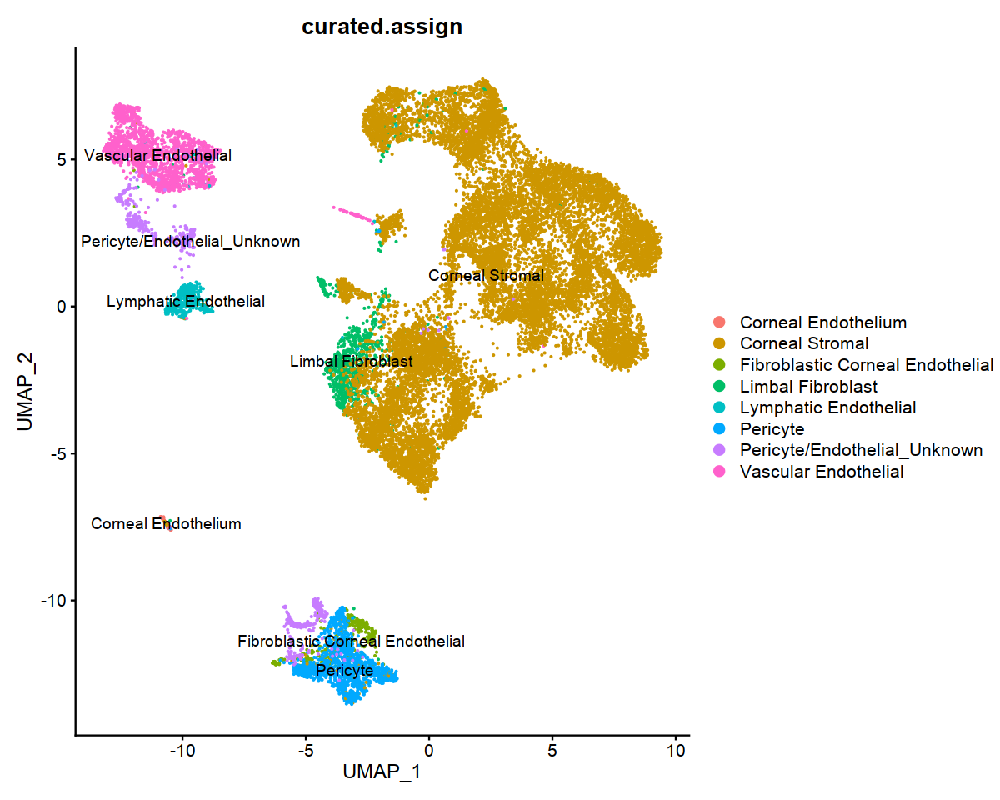

In [149]:
DimPlot(lineage, group.by = 'curated.assign' ,label = T, pt.size = 0.1)

In [ ]:
# check with other markers

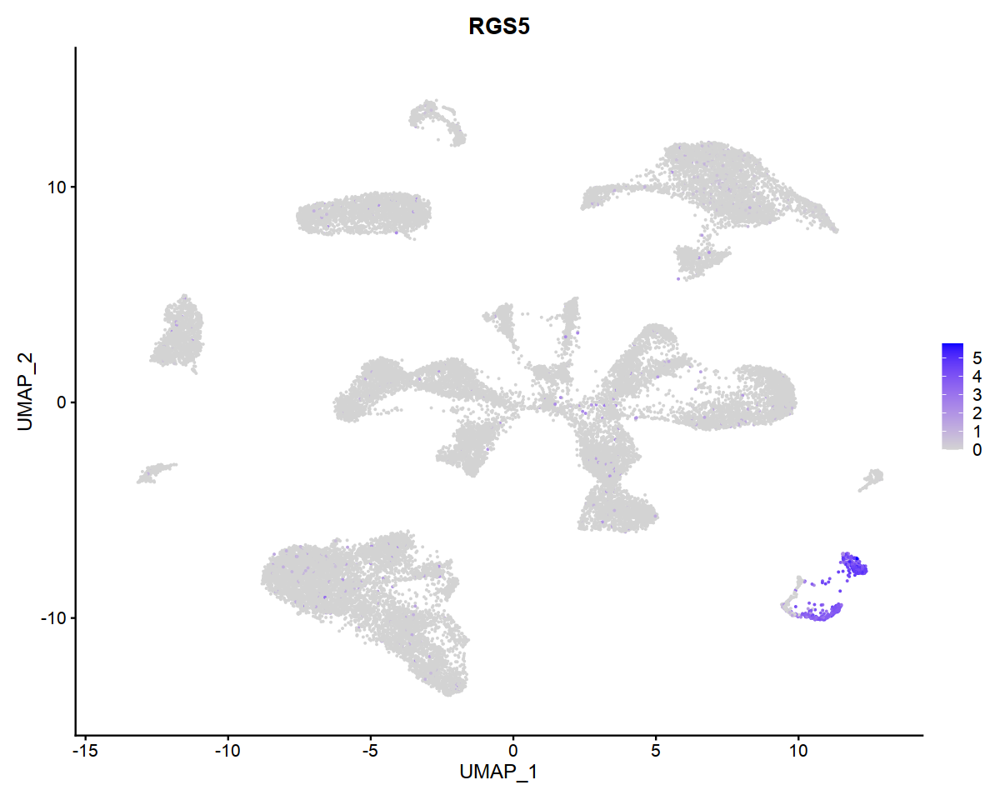

In [151]:
# use marker in paper2
DefaultAssay(data_list[[3]]) <- 'RNA'
FeaturePlot(data_list[[3]], features = c('RGS5'), slot = 'data')

In [155]:
data_list[[3]]$curated.assign[which(data_list[[3]]$seurat_clusters %in% c(20))] = 'Endothelial'
data_list[[3]]$curated.assign[which(data_list[[3]]$seurat_clusters %in% c(23))] = 'Pericyte'

In [156]:
for (i in 1:length(data_list)){
    data_list[[i]]$level3 = data_list[[i]]$curated.assign
}
celltype = c()
for (i in 1:length(data_list)){
    celltype = c(celltype,data_list[[i]]$level3)
}
print(as.data.frame(sort(unique(celltype))))

             sort(unique(celltype))
1                          Amacirne
2                         Astrocyte
3                       Blood Vesel
4                              CD8T
5                              Cone
6                       Cone Off BC
7         Cone On BC/Rod BC_Unknown
8     Conjunctival Basal Epithelium
9          Corneal Basal Epithelium
10              Corneal Endothelium
11                  Corneal Stromal
12                               DC
13                      Endothelial
14 Fibroblastic Corneal Endothelial
15                       Horizontal
16                Limbal Epithelial
17                Limbal Fibroblast
18   Limbal Neural Crest Progenitor
19                Limbal Progenitor
20         Limbal Stroma Keratocyte
21    Limbal Superficial Epithelium
22                Limbal Suprabasal
23            Lymphatic Endothelial
24                 Lymphatic Vessel
25                       Macrophage
26              Macrophage/Monocyte
27                       Mel

In [166]:
for(i in 1:length(data_list)){
    print(data_list[[i]]@project.name)
}

[1] "GSE155683_Eye-Adult_20460"
[1] "GSE157474"
[1] "GSE131696_Eye-Adult_29073_CCA"


In [170]:
data_list[[1]]@project.name = 'HU_0308_Eye_GSE155683'
data_list[[2]]@project.name = 'HU_0316_Eye_GSE157474'
data_list[[3]]@project.name = 'HU_0367_Eye_GSE169047'

In [185]:
for (i in 1:length(files)){
    saveRDS(data_list[[i]],file)
}